# Testing neural networks approach to numerical integration on Genz numerical integration testing package

## Library import

In [51]:
%run ../skuld/skuld.py      # skuld NNI library
%run ../utils/plots.py      # plotting functions
%run ../utils/integrate.py  # 'classic' numerical integration function

In [6]:
def osc_1d(X):
    return torch.cos(2 * math.pi * u + X * c)

def osc_1d_float(X):
    return math.cos(2 * math.pi * u + X * c)

In [7]:
u = random.uniform(0, 1)
cs = random.uniform(0, 1)
c = cs

In [9]:
X, y = generate_data(osc_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

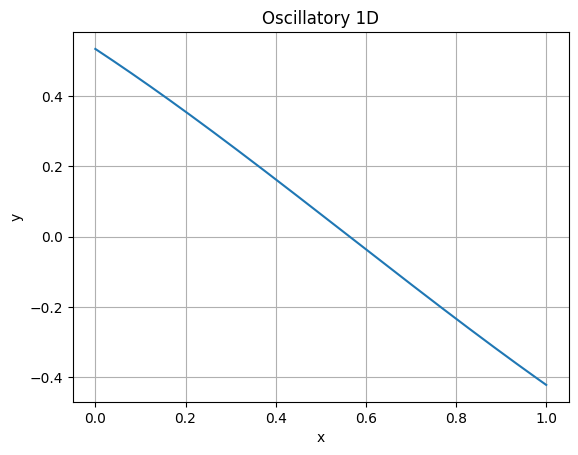

In [20]:
x_np = X[:, 0].numpy()
y_np = y.numpy()
plt.plot(x_np, y_np)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Oscillatory 1D')
plt.grid(True)
plt.show()

In [21]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

## Model

### Hyperparams for the NN model

In [129]:
input_size = 1
hidden_size = 10
learning_rate = 0.001
num_epochs = 5000

### Model definition, compilation and training

In [130]:
model = MLP(input_size, hidden_size)

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs)

Epoch [100/5000], Loss: 0.0757163912
Epoch [200/5000], Loss: 0.0647155568
Epoch [300/5000], Loss: 0.0545887016
Epoch [400/5000], Loss: 0.0447357930
Epoch [500/5000], Loss: 0.0350361243
Epoch [600/5000], Loss: 0.0257063266
Epoch [700/5000], Loss: 0.0172666162
Epoch [800/5000], Loss: 0.0103747491
Epoch [900/5000], Loss: 0.0054799453
Epoch [1000/5000], Loss: 0.0025359904
Epoch [1100/5000], Loss: 0.0010556624
Epoch [1200/5000], Loss: 0.0004324869
Epoch [1300/5000], Loss: 0.0002096105
Epoch [1400/5000], Loss: 0.0001396118
Epoch [1500/5000], Loss: 0.0001185566
Epoch [1600/5000], Loss: 0.0001108712
Epoch [1700/5000], Loss: 0.0001063045
Epoch [1800/5000], Loss: 0.0001023240
Epoch [1900/5000], Loss: 0.0000983939
Epoch [2000/5000], Loss: 0.0000944251
Epoch [2100/5000], Loss: 0.0000904143
Epoch [2200/5000], Loss: 0.0000863728
Epoch [2300/5000], Loss: 0.0000823140
Epoch [2400/5000], Loss: 0.0000782517
Epoch [2500/5000], Loss: 0.0000741994
Epoch [2600/5000], Loss: 0.0000701707
Epoch [2700/5000], Lo

In [131]:
summary(model, (input_size,)) # (input_size, ) - input shape

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 10]              20
           Sigmoid-2                   [-1, 10]               0
            Linear-3                    [-1, 1]              11
Total params: 31
Trainable params: 31
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------


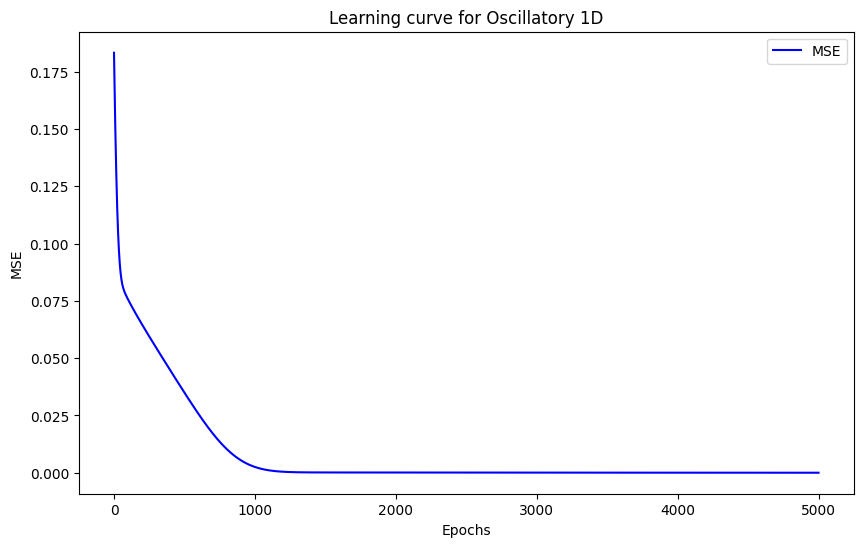

In [132]:
plt.figure(figsize=(10, 6))
plt.plot(train_history, label='MSE', color='b')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.title('Learning curve for Oscillatory 1D')
plt.legend()
plt.grid(False)
plt.show()

### Model testing

In [133]:
test_loss = test_model(model, criterion, x_test, y_test)
print(f"Test Loss: {test_loss:.10f}")

Test Loss: 0.0000058017


In [134]:
bs1, we1, bs2, we2 = extract_model_params(model)

In [135]:
a = 0.0
b = 1.0

In [140]:
nni = get_NN_integral(a, b, bs1, we1, bs2, we2)

nni

0.061260837151441906

In [141]:
result, error = scipy.integrate.quad(osc_1d_float, a, b)

print("Integral:", result)
print("Error:", error)

Integral: 0.8532598358708471
Error: 9.473087157716965e-15


In [142]:
abs(nni - result)

0.7919989987194052

# 1D testing

## Hyperparams for 1D

In [45]:
input_size = 1
hidden_size = 10
learning_rate = 0.001
num_epochs = 5000

a = [0.0]
b = [1.0]

## Oscillatory 1D

In [52]:
def test_osc_1d(iteration_index: int, h: float):
       
    u = random.uniform(0, 1)
    cs = random.uniform(0, 1)
    c = h # / cs
    
    def osc_1d(X):
        return torch.cos(2 * math.pi * u + X * c)

    def osc_1d_float(X):
        return math.cos(2 * math.pi * u + X * c)
  
    X, y = generate_data(osc_1d, lower=a, upper=b, n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title("Oscillatory 1D")
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    model.compile(criterion=nn.MSELoss(), optimizer=optim.Adam(model.parameters(), lr=learning_rate))
    train_history = model.train(x_train, y_train, num_epochs, verbose=False)
    test_loss = model.test(x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    nni = NeuralNumericalIntegration.integrate(model, a, b, n_dims=1)
    
    result_quad, _ = scipy.integrate.quad(osc_1d_float, a[0], b[0])
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = osc_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return nni, result_quad, result_trapz

Iteration 1 is running!


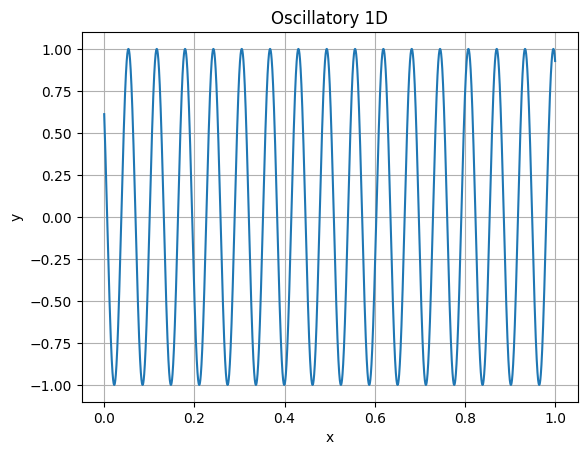

Training done! Time elapsed: 6.85 seconds
Test Loss: 0.4977846742
-0.0041867476
Iteration 2 is running!


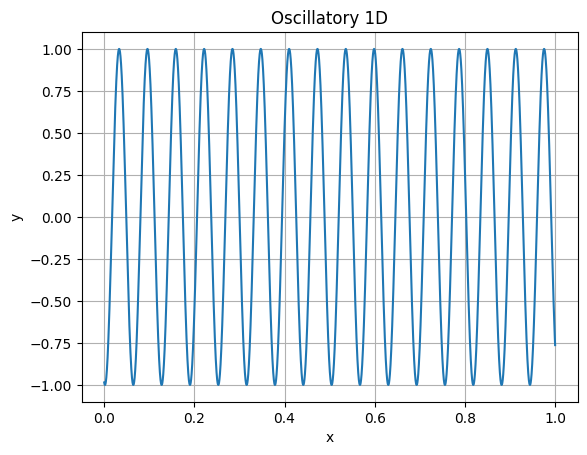

Training done! Time elapsed: 5.44 seconds
Test Loss: 0.4880333245
0.004753285
Iteration 3 is running!


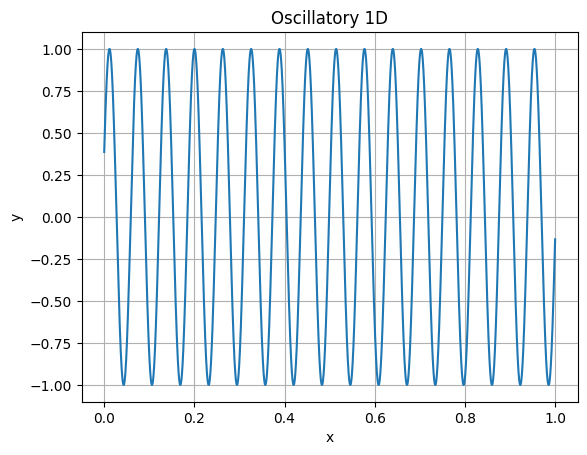

Training done! Time elapsed: 5.40 seconds
Test Loss: 0.5135346055
-0.0006887801
Iteration 4 is running!


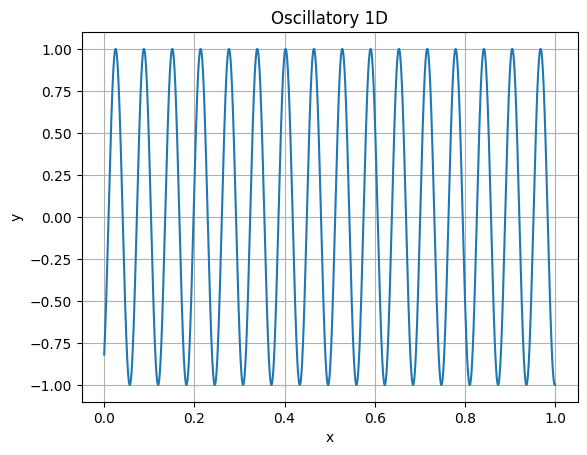

Training done! Time elapsed: 5.63 seconds
Test Loss: 0.5103147030
0.0049386704
Iteration 5 is running!


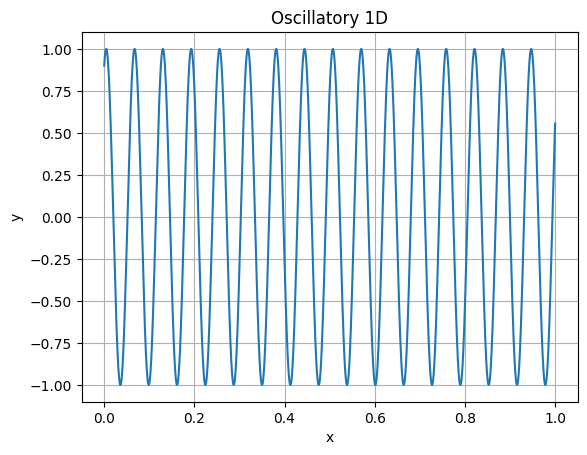

Training done! Time elapsed: 5.59 seconds
Test Loss: 0.5013961196
-0.003959595
Iteration 6 is running!


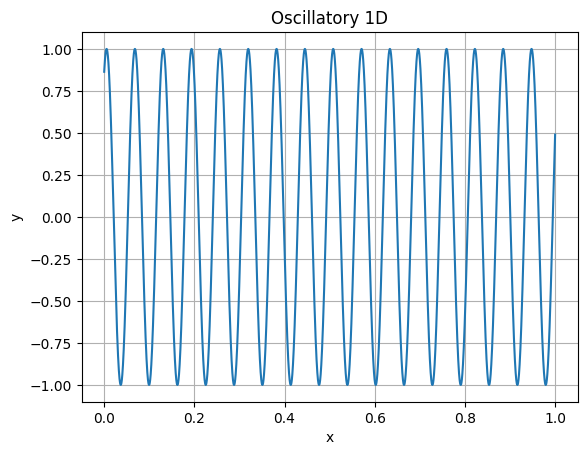

Training done! Time elapsed: 5.51 seconds
Test Loss: 0.4886477590
-0.003681833
Iteration 7 is running!


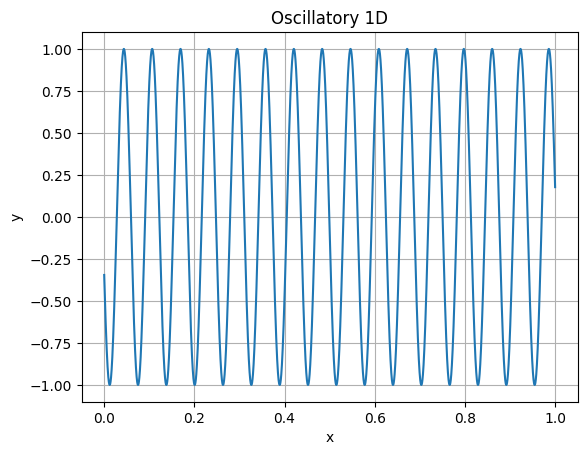

Training done! Time elapsed: 7.27 seconds
Test Loss: 0.4853878319
0.0004570447
Iteration 8 is running!


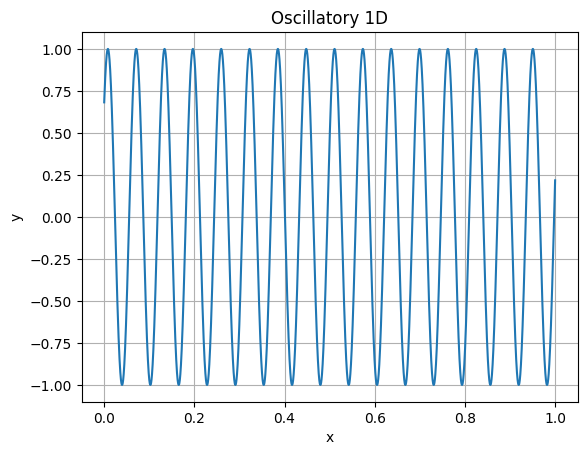

Training done! Time elapsed: 6.35 seconds
Test Loss: 0.5140935779
-0.002446361
Iteration 9 is running!


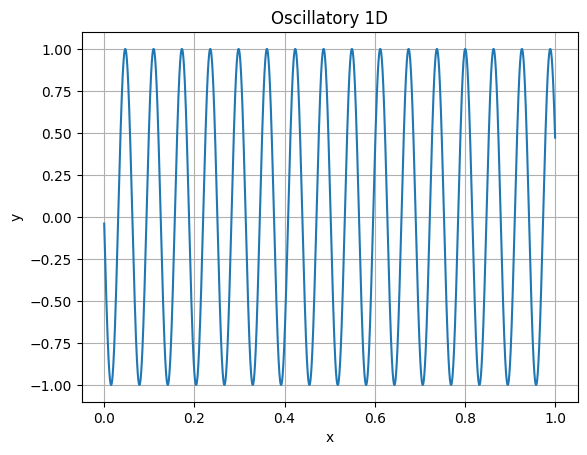

Training done! Time elapsed: 6.06 seconds
Test Loss: 0.5033826232
-0.0011739023
Iteration 10 is running!


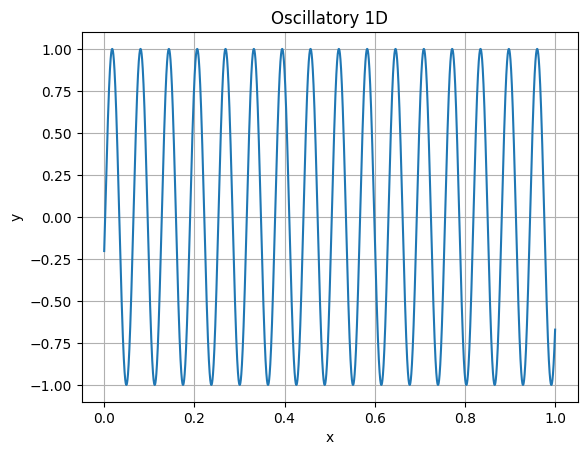

Training done! Time elapsed: 6.37 seconds
Test Loss: 0.5069763660
0.0023762658


In [53]:
results = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results.append(test_osc_1d(i, h=100))

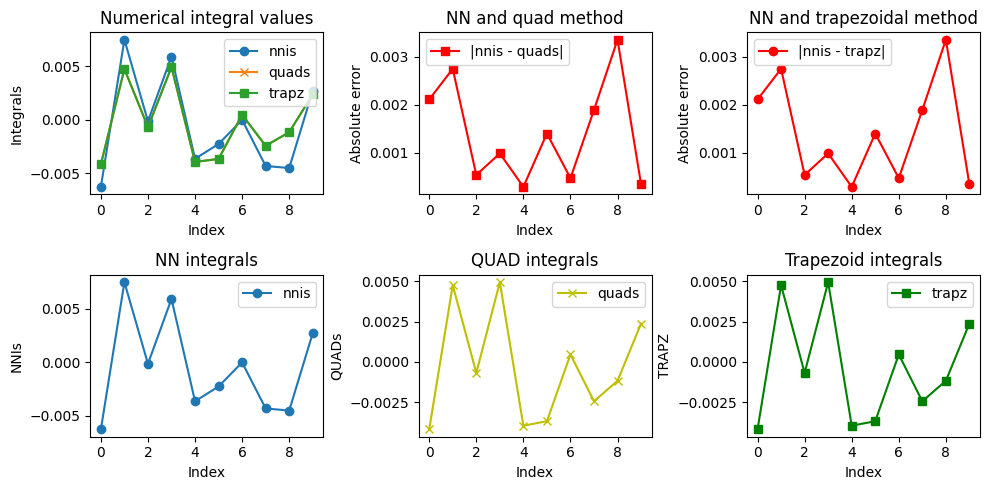

In [54]:
plot_test_results(results)

# Product peak 1D

In [150]:
def test_prod_peek_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0, 1)
    c = h # / cs

    def prod_peak_1d(X):
        return 1 / (c**(-2) + (X - u)**2)

    def prod_peak_1d_float(X):
        return 1 / (c**(-2) + (X - u)**2)
  
    X_init, y_init = generate_data(prod_peak_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    scalerx = MinMaxScaler((0, 1))    
    scalery = MinMaxScaler((0, 1))    
    X = torch.tensor(scalerx.fit_transform(X_init), dtype=torch.float32)
    y = torch.tensor(scalery.fit_transform(y_init), dtype=torch.float32)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Product peek 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model) 
    nni_scaled = get_NN_integral(a, b, bs1, we1, bs2, we2)
    nni = scale_back(nni_scaled, scalerx, scalery, X_init, y_init, frange=(0, 1), n_dim=1)
    
    result_quad, _ = scipy.integrate.quad(prod_peak_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = prod_peak_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
   
    return nni, result_quad, result_trapz

Iteration 1 is running!


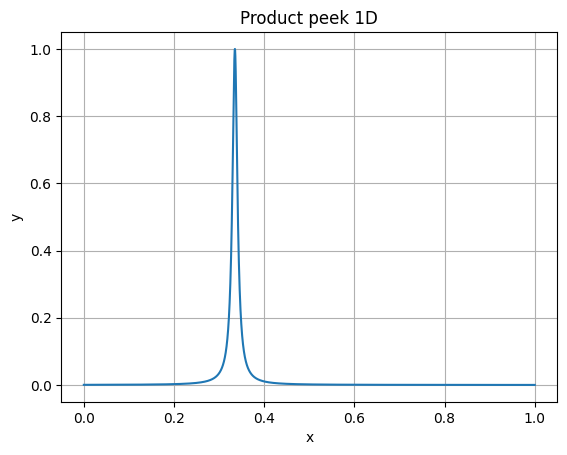

Training done! Time elapsed: 5.55 seconds
Test Loss: 0.0063606552
Iteration 2 is running!


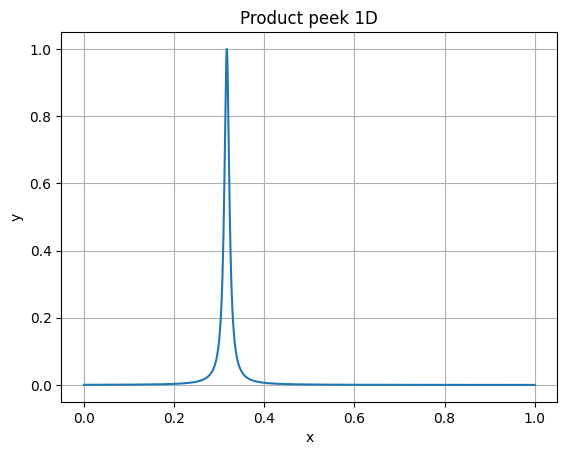

Training done! Time elapsed: 5.48 seconds
Test Loss: 0.0121442294
Iteration 3 is running!


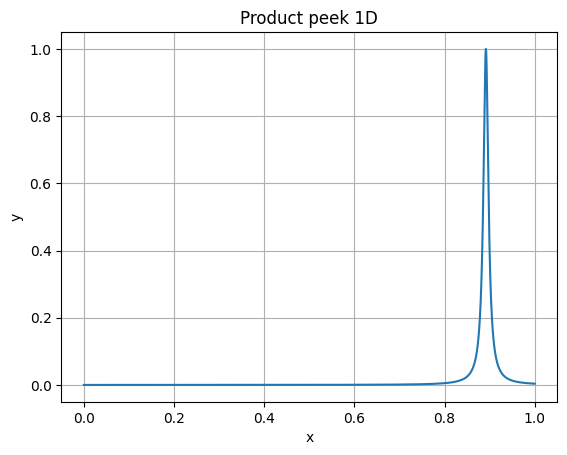

Training done! Time elapsed: 6.32 seconds
Test Loss: 0.0138219548
Iteration 4 is running!


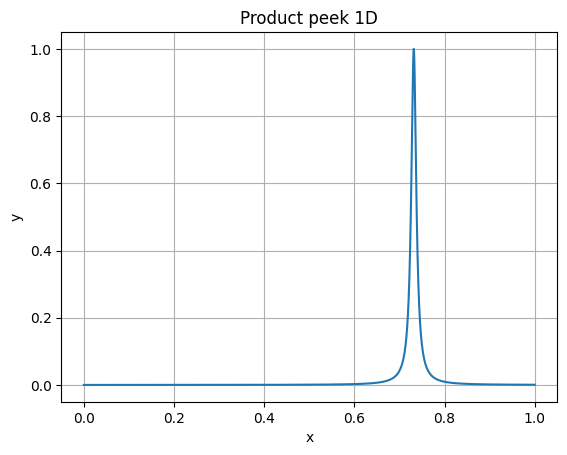

Training done! Time elapsed: 6.47 seconds
Test Loss: 0.0116386432
Iteration 5 is running!


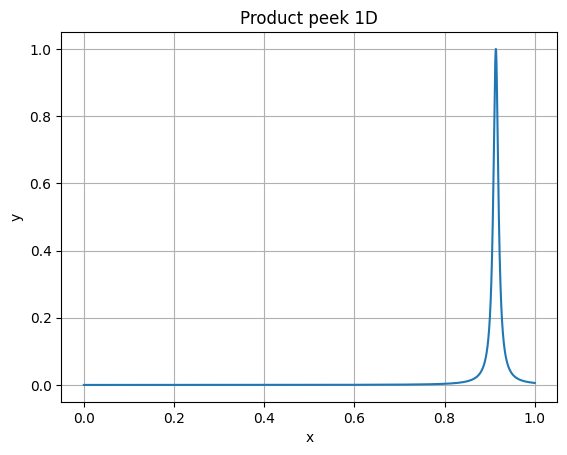

Training done! Time elapsed: 6.74 seconds
Test Loss: 0.0111610880
Iteration 6 is running!


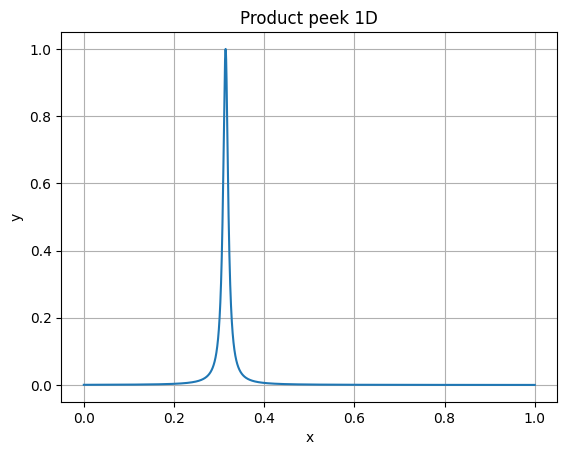

Training done! Time elapsed: 6.14 seconds
Test Loss: 0.0081038382
Iteration 7 is running!


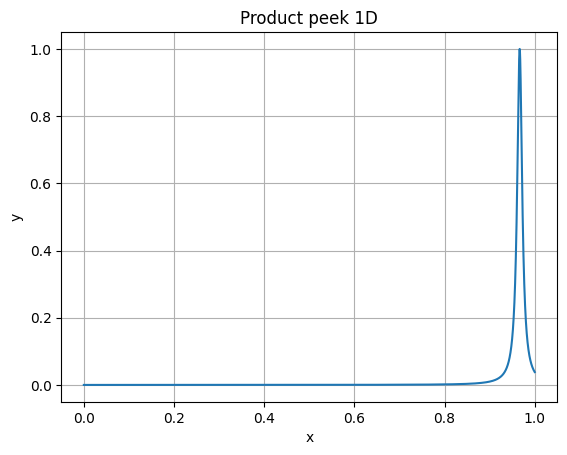

Training done! Time elapsed: 5.49 seconds
Test Loss: 0.0088295061
Iteration 8 is running!


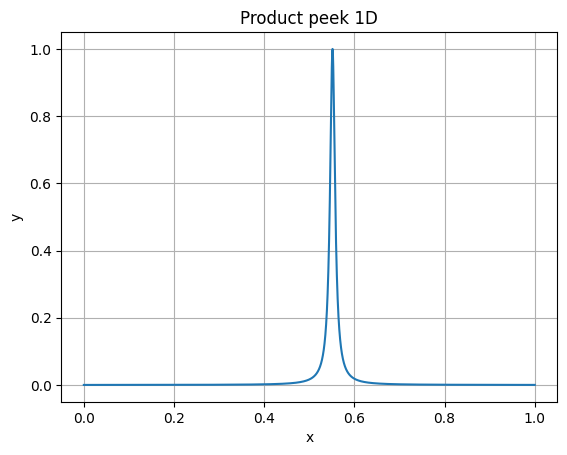

Training done! Time elapsed: 5.92 seconds
Test Loss: 0.0083266869
Iteration 9 is running!


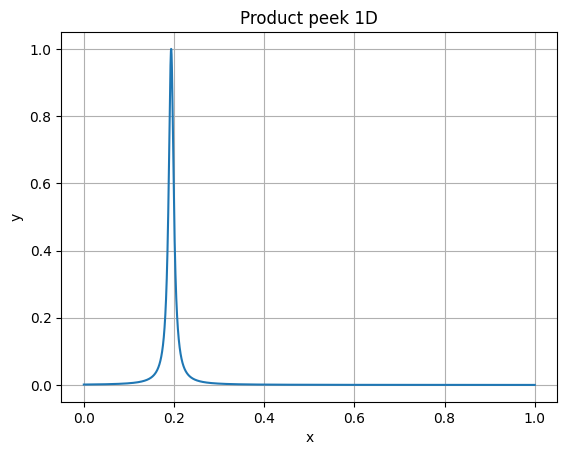

Training done! Time elapsed: 5.41 seconds
Test Loss: 0.0117088268
Iteration 10 is running!


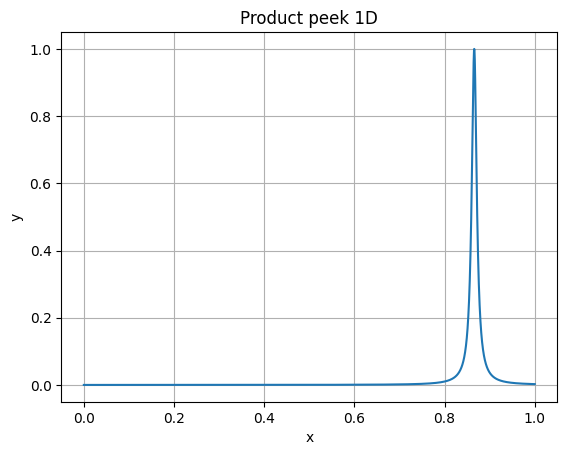

Training done! Time elapsed: 5.45 seconds
Test Loss: 0.0065157898


In [151]:
results2 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results2.append(test_prod_peek_1d(i, 150))

/usr/local/lib/python3.11/site-packages/numpy/core/shape_base.py:65: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  ary = asanyarray(ary)
/usr/local/lib/python3.11/site-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


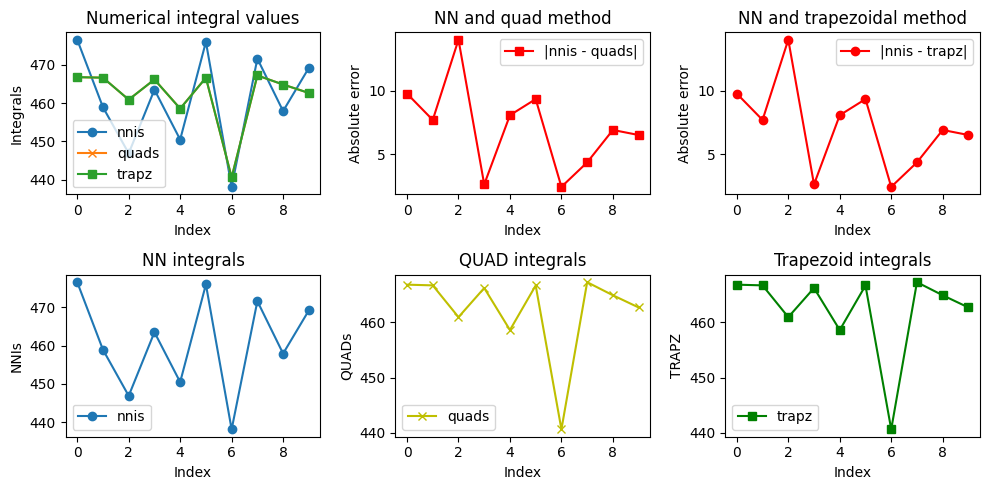

In [152]:
plot_test_results(results2)

In [74]:
def osc_1d(X):
    return 1 / (c**(-2) + (X - u)**2)

def osc_1d_float(X):
    return 1 / (c**(-2) + (X - u)**2)
  
X, y = generate_data(osc_1d, lower=[0.0], upper=[1.0], n_samples=10, n_dim=1)

# Corner peak 1D

In [39]:
def test_corn_peek_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0.5, 1)
    c = h * cs

    def corn_peek_1d(X):
        return (1 + c * x) ** (-2)

    def corn_peek_float(X):
        return (1 + c * x) ** (-2)
  
    X, y = generate_data(osc_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Corner Peek 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model)
    
    nni = get_NN_integral(a, b, bs1, we1, bs2, we2)
    
    result_quad, _ = scipy.integrate.quad(osc_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = osc_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


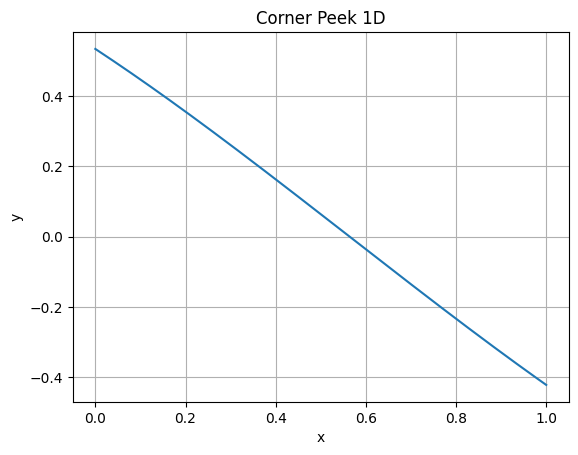

Training done! Time elapsed: 5.37 seconds
Test Loss: 0.0000428692
0.06123581
Iteration 2 is running!


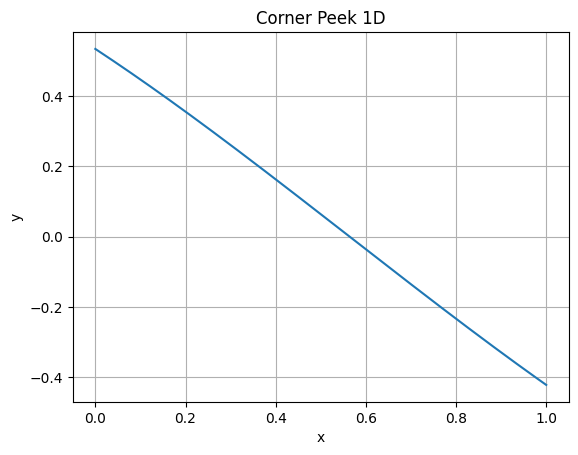

Training done! Time elapsed: 5.48 seconds
Test Loss: 0.0000047837
0.06123581
Iteration 3 is running!


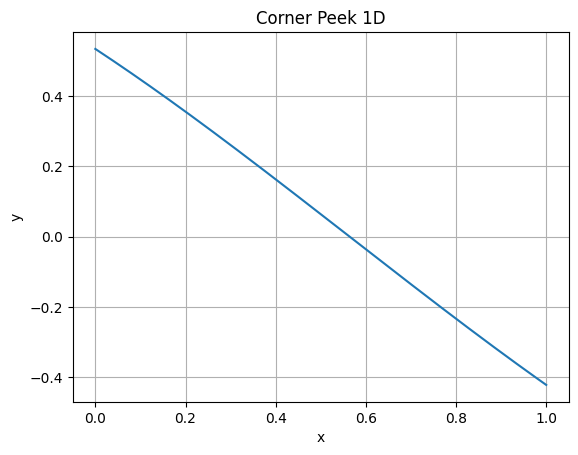

Training done! Time elapsed: 5.48 seconds
Test Loss: 0.0000029590
0.06123581
Iteration 4 is running!


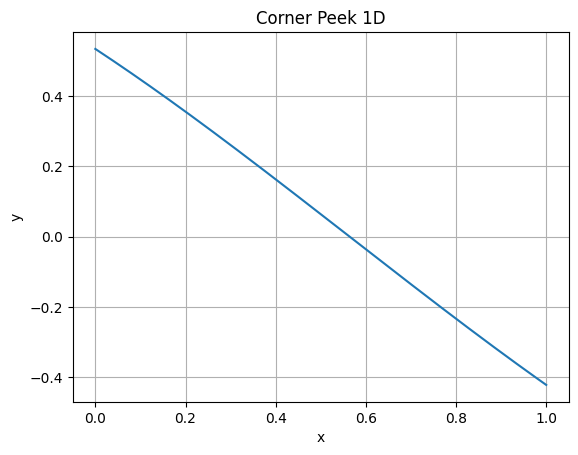

Training done! Time elapsed: 5.44 seconds
Test Loss: 0.0000002770
0.06123581
Iteration 5 is running!


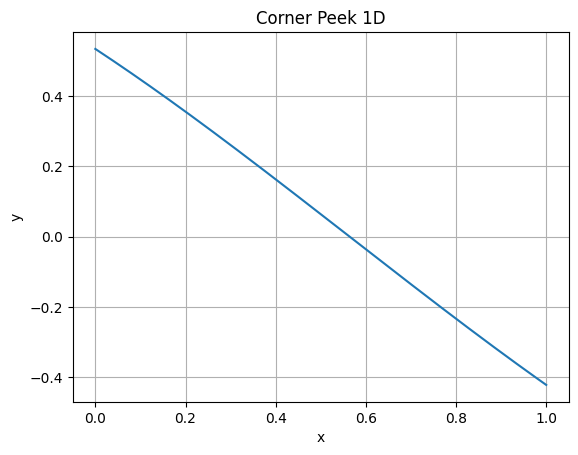

Training done! Time elapsed: 5.70 seconds
Test Loss: 0.0000023531
0.06123581
Iteration 6 is running!


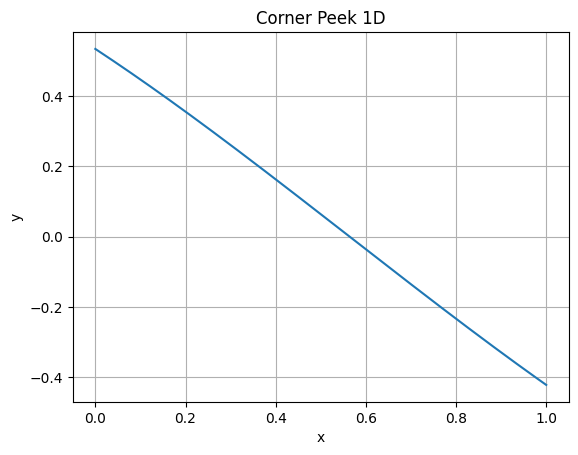

Training done! Time elapsed: 6.28 seconds
Test Loss: 0.0000010809
0.06123581
Iteration 7 is running!


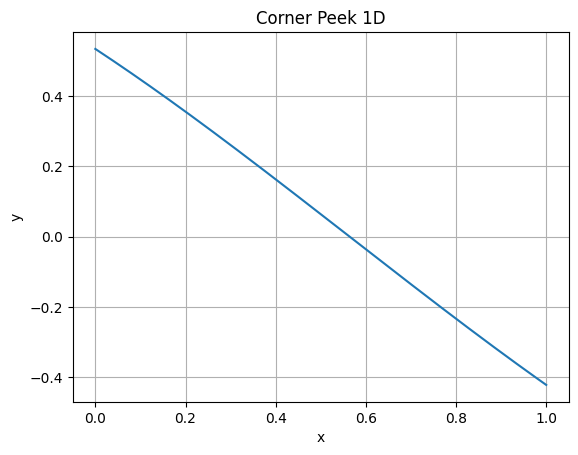

Training done! Time elapsed: 5.63 seconds
Test Loss: 0.0000062487
0.06123581
Iteration 8 is running!


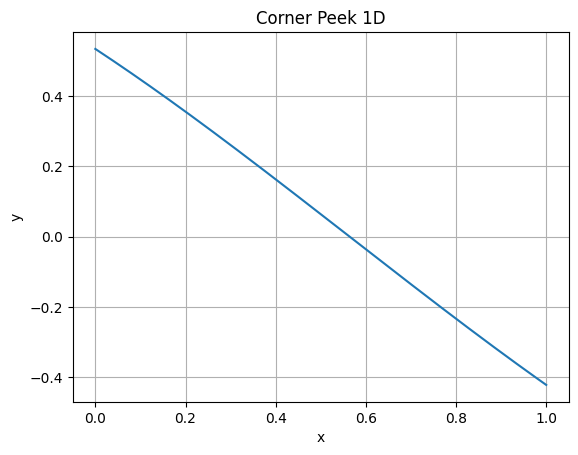

Training done! Time elapsed: 5.68 seconds
Test Loss: 0.0000000462
0.06123581
Iteration 9 is running!


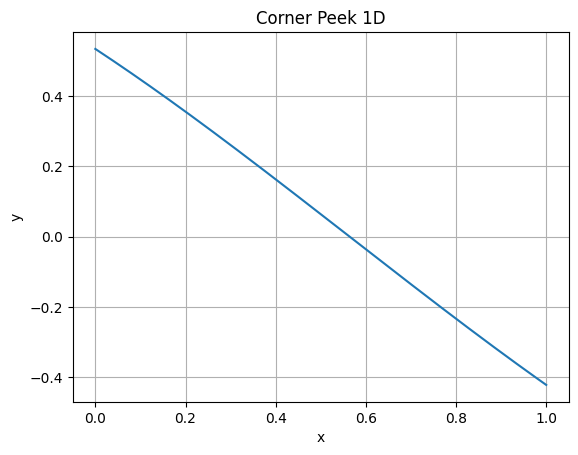

Training done! Time elapsed: 5.96 seconds
Test Loss: 0.0000041329
0.06123581
Iteration 10 is running!


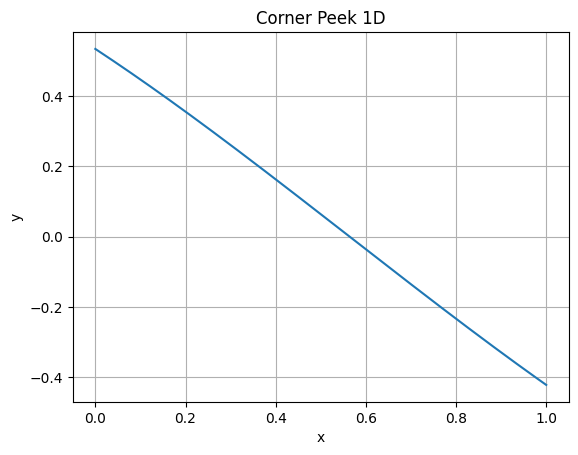

Training done! Time elapsed: 5.78 seconds
Test Loss: 0.0000182023
0.06123581


In [40]:
results3 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results3.append(test_corn_peek_1d(i, 600))

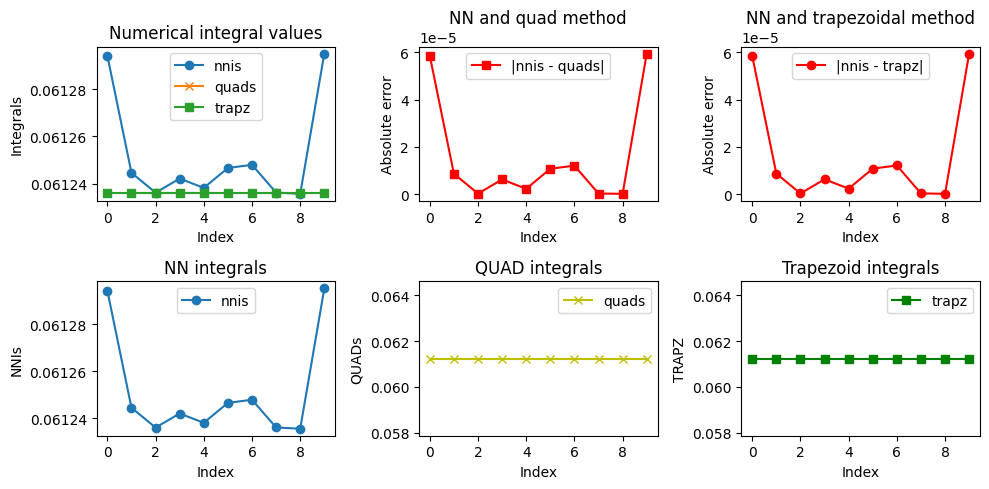

In [41]:
plot_test_results(results3)

# Gaussian 1D

In [42]:
def test_gauss_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0.5, 1)
    c = h # * cs

    def gauss_1d(X):
        return torch.exp(- c**2 * (X - u)**2)

    def gauss_1d_float(X):
        return np.exp(- c**2 * (X - u)**2)
  
    X, y = generate_data(gauss_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Gaussian 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model)
    
    nni = get_NN_integral(a, b, bs1, we1, bs2, we2)
    
    result_quad, _ = scipy.integrate.quad(gauss_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = gauss_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


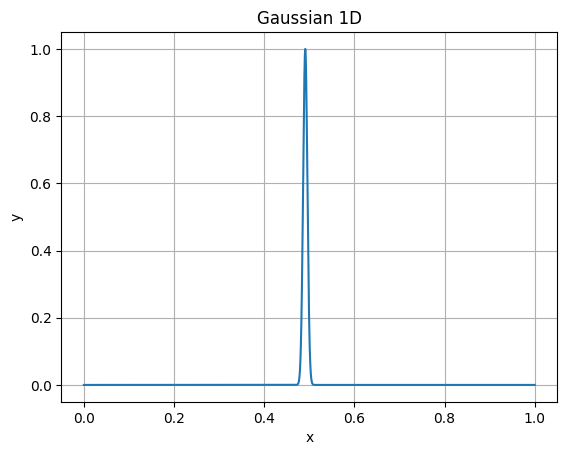

Training done! Time elapsed: 5.96 seconds
Test Loss: 0.0079427222
0.06123581
Iteration 2 is running!


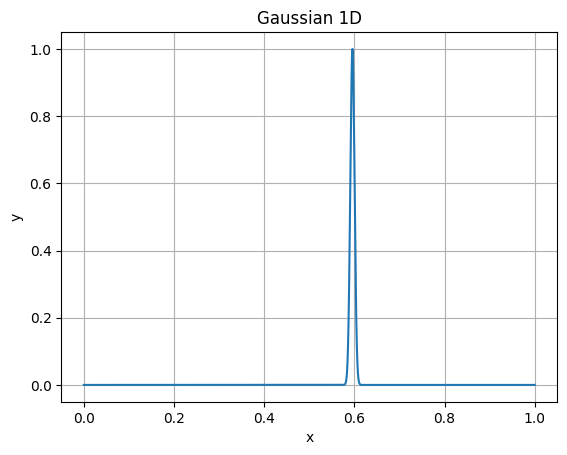

Training done! Time elapsed: 6.15 seconds
Test Loss: 0.0077823158
0.06123581
Iteration 3 is running!


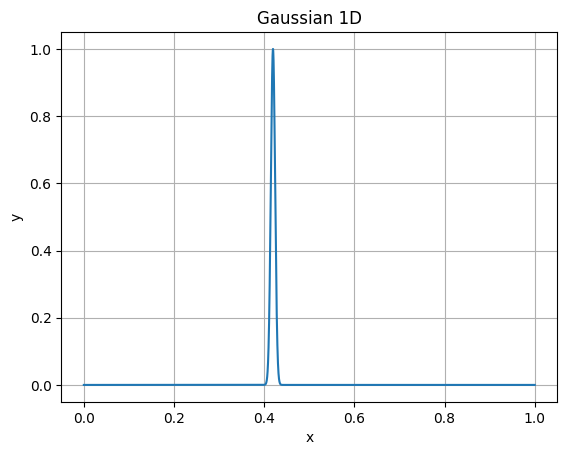

Training done! Time elapsed: 5.72 seconds
Test Loss: 0.0089434655
0.06123581
Iteration 4 is running!


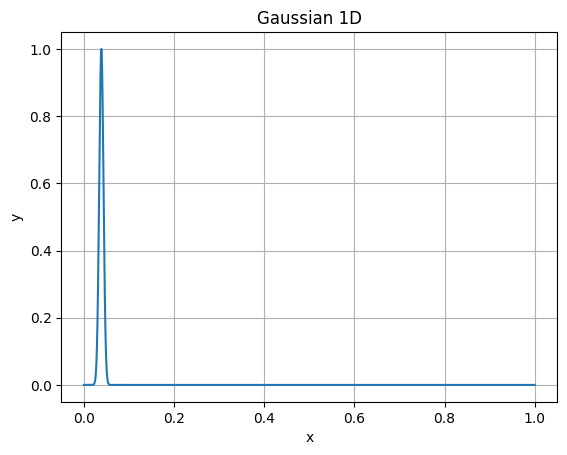

Training done! Time elapsed: 5.64 seconds
Test Loss: 0.0083329333
0.06123581
Iteration 5 is running!


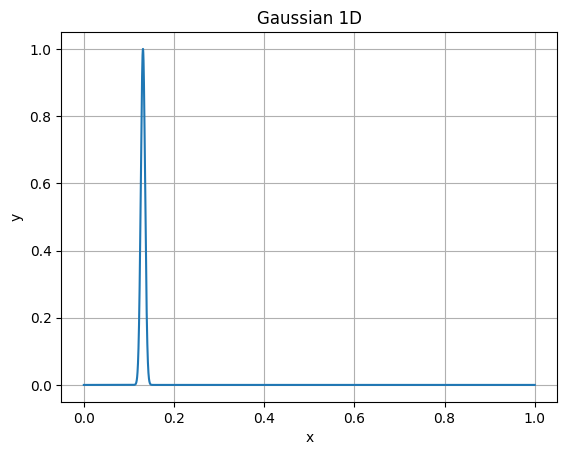

Training done! Time elapsed: 6.13 seconds
Test Loss: 0.0096310042
0.06123581
Iteration 6 is running!


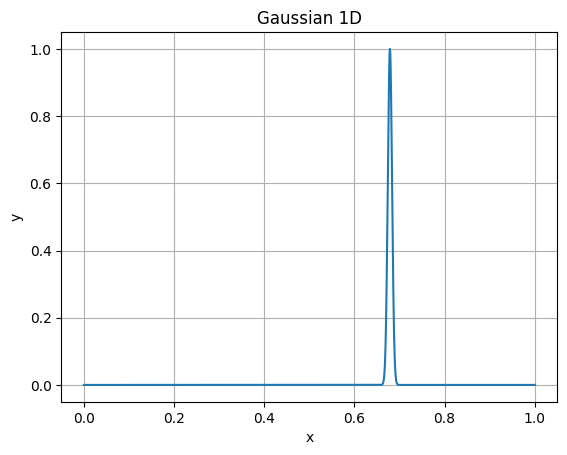

Training done! Time elapsed: 5.72 seconds
Test Loss: 0.0087028220
0.06123581
Iteration 7 is running!


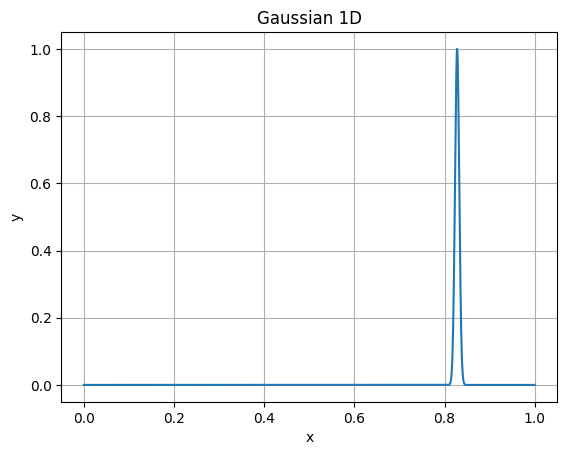

Training done! Time elapsed: 5.77 seconds
Test Loss: 0.0084397998
0.06123581
Iteration 8 is running!


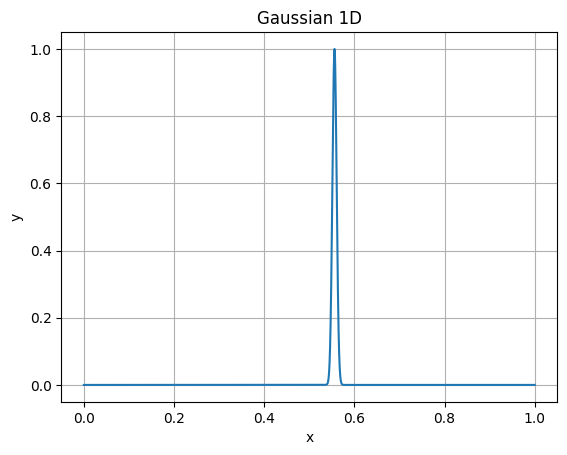

Training done! Time elapsed: 5.62 seconds
Test Loss: 0.0103358766
0.06123581
Iteration 9 is running!


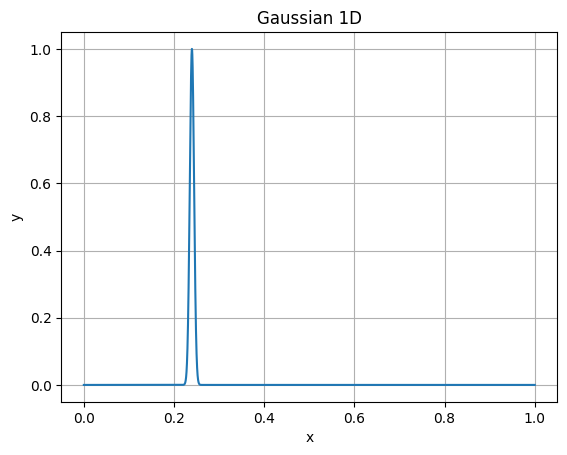

Training done! Time elapsed: 5.45 seconds
Test Loss: 0.0078870300
0.06123581
Iteration 10 is running!


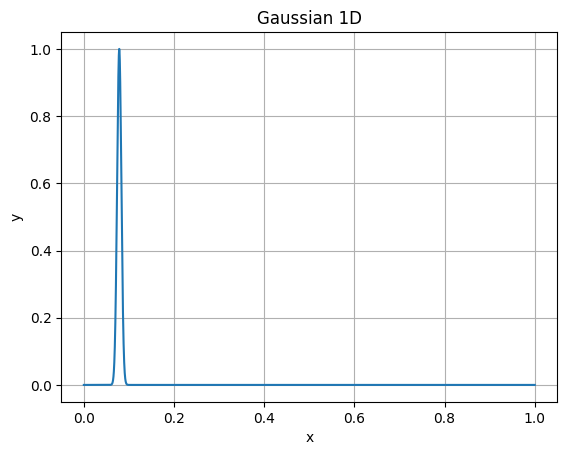

Training done! Time elapsed: 6.02 seconds
Test Loss: 0.0040151700
0.06123581


In [43]:
results4 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results4.append(test_gauss_1d(i, 150))

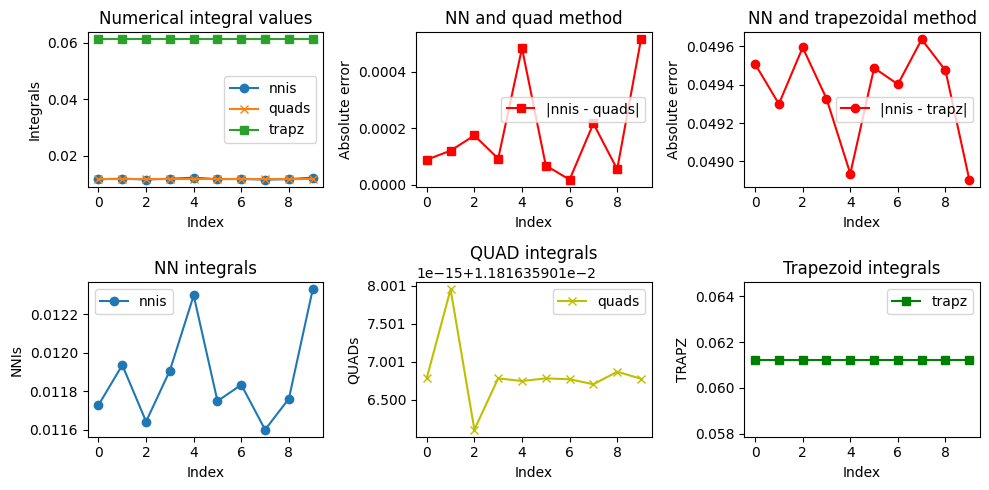

In [44]:
plot_test_results(results4)

# Continuos 1D

In [45]:
def test_cont_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0.5, 1)
    c = h # * cs

    def cont_1d(X):
        return torch.exp(- c * abs(X - u))

    def cont_1d_float(X):
        return np.exp(- c * abs(X - u))
  
    X, y = generate_data(cont_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Continuos 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model)
    
    nni = get_NN_integral(a, b, bs1, we1, bs2, we2)
    
    result_quad, _ = scipy.integrate.quad(cont_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = cont_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


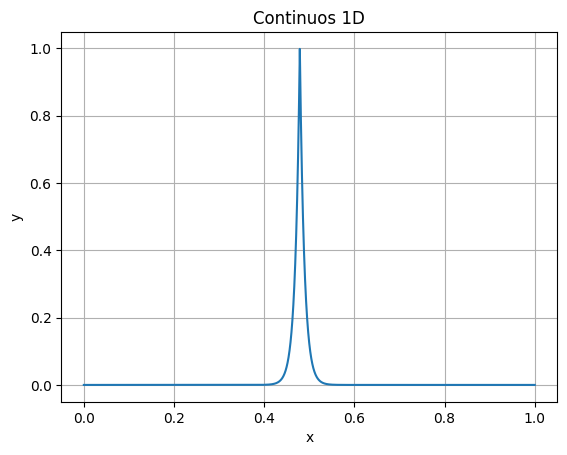

Training done! Time elapsed: 5.98 seconds
Test Loss: 0.0111678150
0.02000003
Iteration 2 is running!


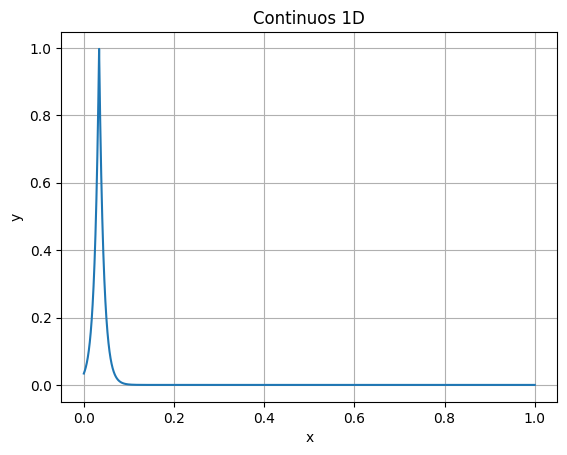

Training done! Time elapsed: 6.12 seconds
Test Loss: 0.0075350427
0.019661969
Iteration 3 is running!


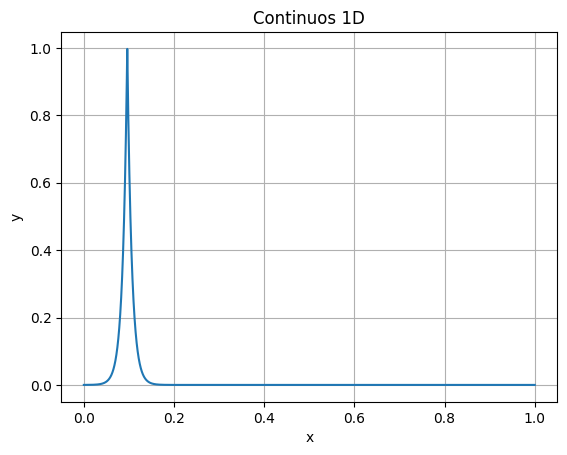

Training done! Time elapsed: 5.59 seconds
Test Loss: 0.0086437436
0.019999309
Iteration 4 is running!


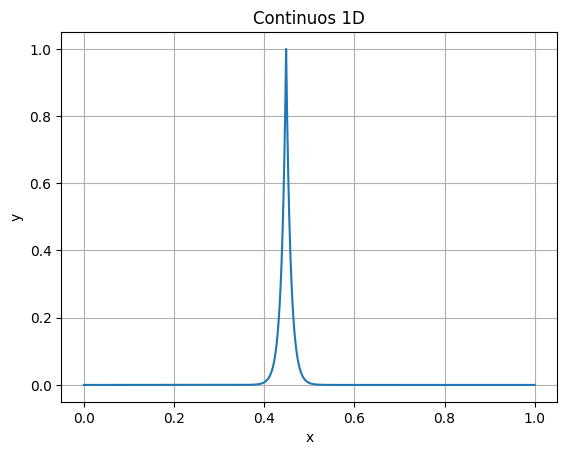

Training done! Time elapsed: 5.65 seconds
Test Loss: 0.0092337541
0.020000143
Iteration 5 is running!


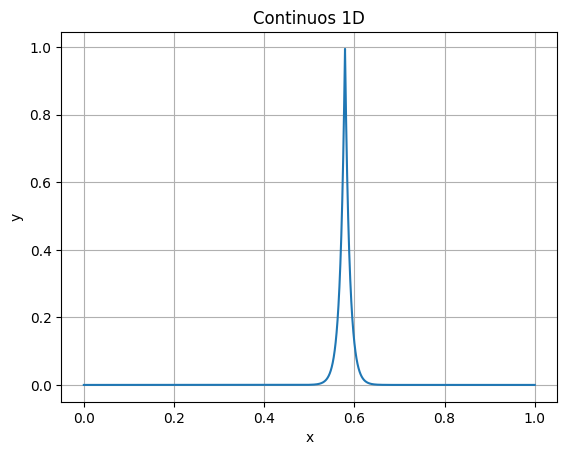

Training done! Time elapsed: 5.90 seconds
Test Loss: 0.0115164602
0.019999916
Iteration 6 is running!


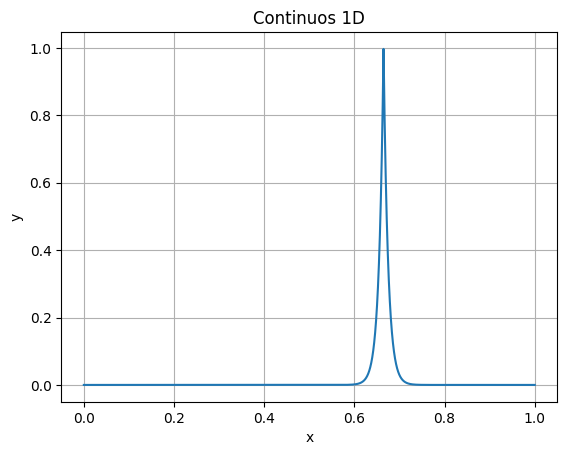

Training done! Time elapsed: 5.89 seconds
Test Loss: 0.0076687639
0.01999995
Iteration 7 is running!


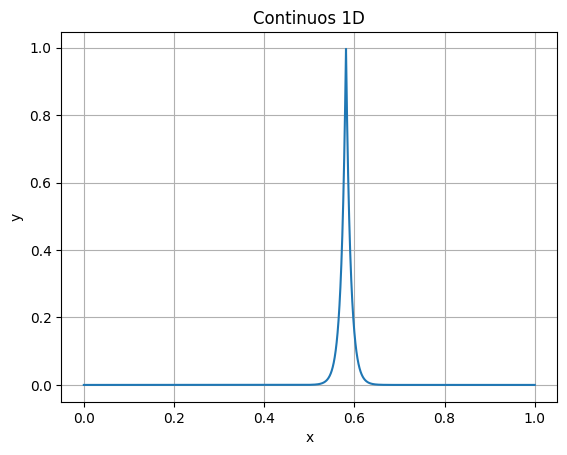

Training done! Time elapsed: 6.07 seconds
Test Loss: 0.0093654031
0.019999927
Iteration 8 is running!


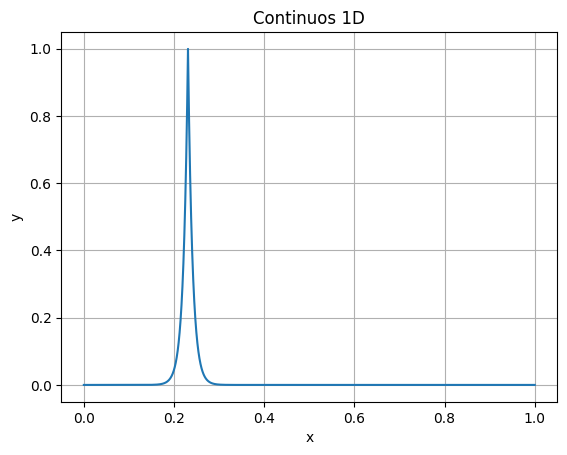

Training done! Time elapsed: 6.17 seconds
Test Loss: 0.0100239459
0.020000063
Iteration 9 is running!


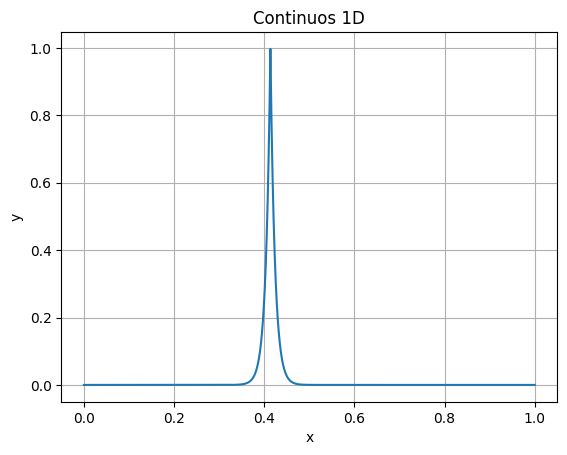

Training done! Time elapsed: 5.76 seconds
Test Loss: 0.0039343261
0.019999972
Iteration 10 is running!


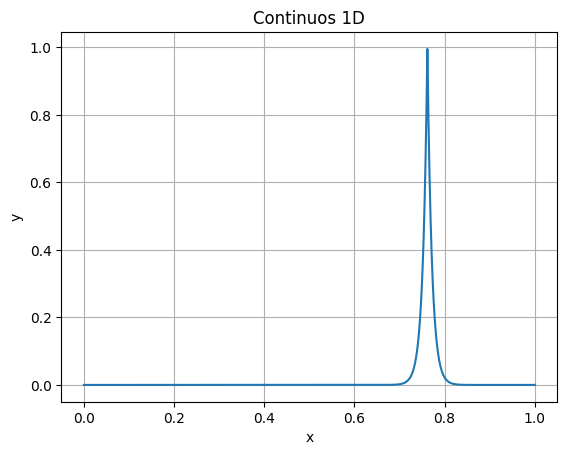

Training done! Time elapsed: 5.84 seconds
Test Loss: 0.0075268568
0.019999921


In [46]:
results5 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results5.append(test_cont_1d(i, 100))

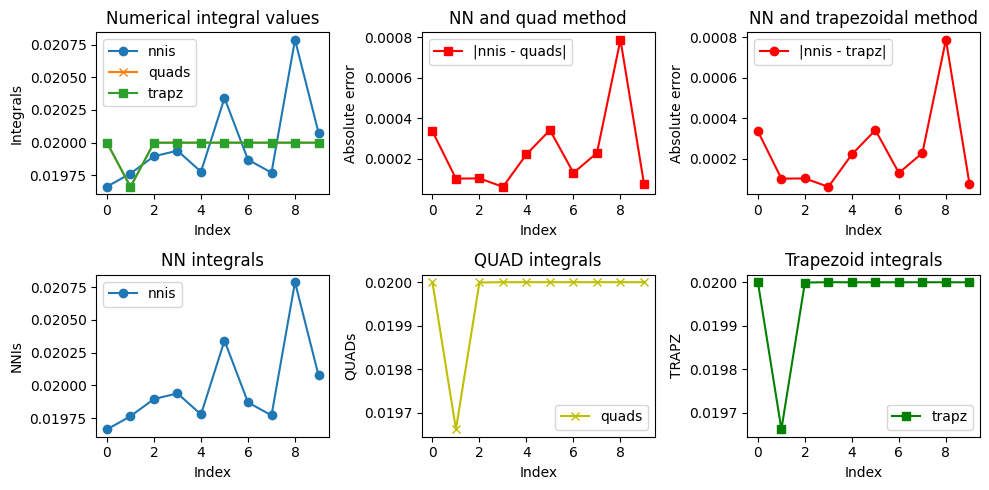

In [47]:
plot_test_results(results5)

# Discontinuous 1D

In [48]:
def test_disk_1d(index, h):
        
    u = random.uniform(0, 1)
    cs = random.uniform(0.5, 1)
    c = h # * cs

    def disk_1d(X):
        y_list = []

        for x in X:
            if x > u:
                y_list.append(0)
            else:
                y_list.append(math.exp(c * x))
        
        return torch.tensor(y_list)

    def disk_1d_float(X):
        if X > u:
            return 0
        else:
            return math.exp(c * X)
          
    X, y = generate_data(disk_1d, lower=[0.0], upper=[1.0], n_samples=10000, n_dim=1)

    x_np = X[:, 0].numpy()
    y_np = y.numpy()
    plt.plot(x_np, y_np)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Disontinuos 1D')
    plt.grid(True)
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params(model)
    
    nni = get_NN_integral(a, b, bs1, we1, bs2, we2)
    
    result_quad, _ = scipy.integrate.quad(disk_1d_float, a, b)
    
    x = torch.linspace(0.0, 1.0, 10000)
    y = disk_1d(x).numpy()
    x = x.numpy()
    
    result_trapz = np.trapz(y, x)
    print(result_trapz)
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


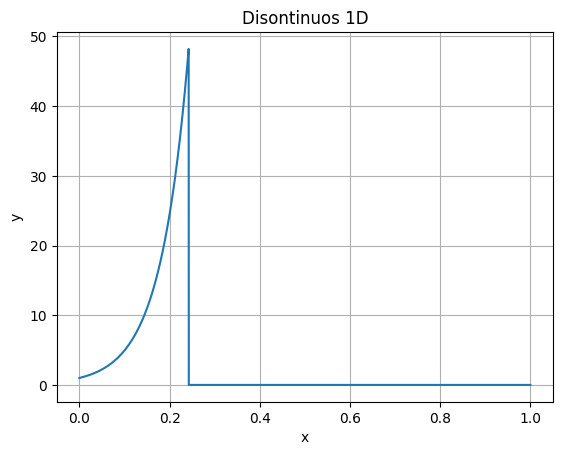

Training done! Time elapsed: 5.48 seconds
Test Loss: 48.8545455933
2.9531002
Iteration 2 is running!


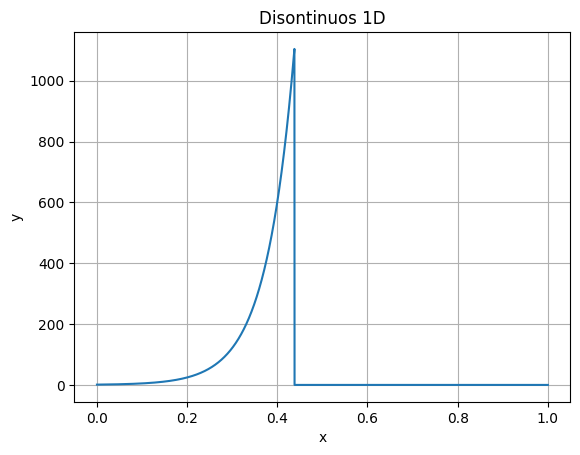

Training done! Time elapsed: 5.46 seconds
Test Loss: 31462.1816406250
69.02072
Iteration 3 is running!


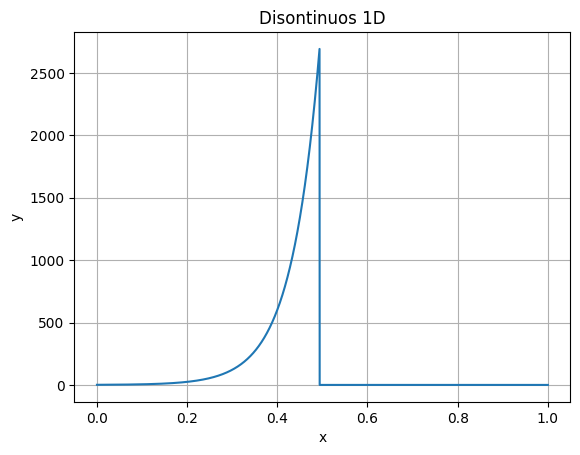

Training done! Time elapsed: 5.96 seconds
Test Loss: 238735.7656250000
168.38113
Iteration 4 is running!


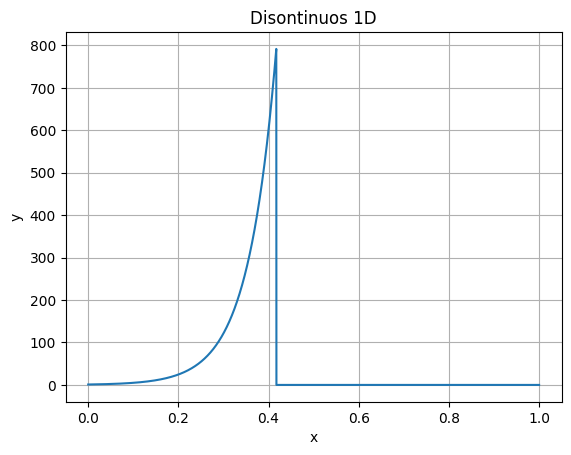

Training done! Time elapsed: 6.28 seconds
Test Loss: 16427.6855468750
49.46255
Iteration 5 is running!


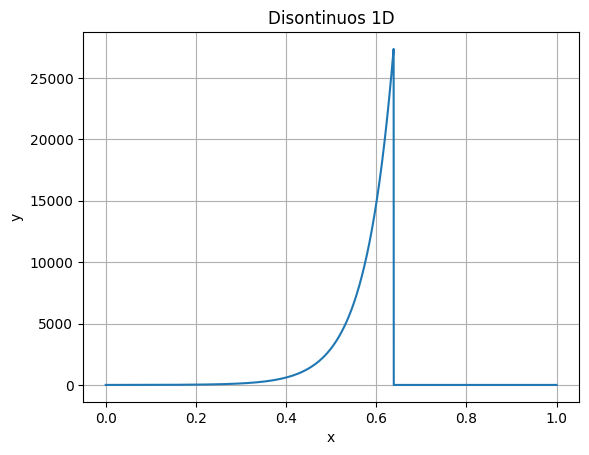

Training done! Time elapsed: 6.26 seconds
Test Loss: 25872840.0000000000
1711.6221
Iteration 6 is running!


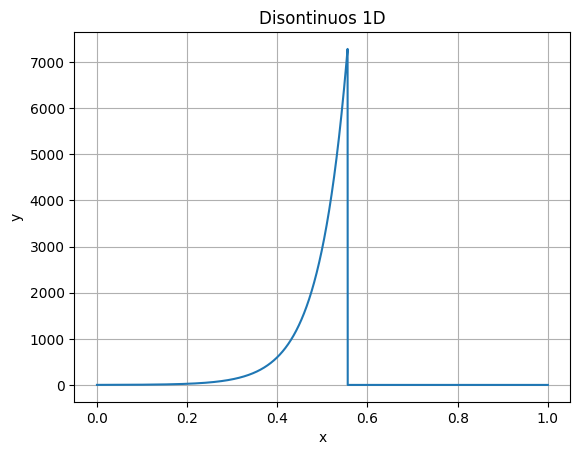

Training done! Time elapsed: 5.79 seconds
Test Loss: 1523187.6250000000
455.66748
Iteration 7 is running!


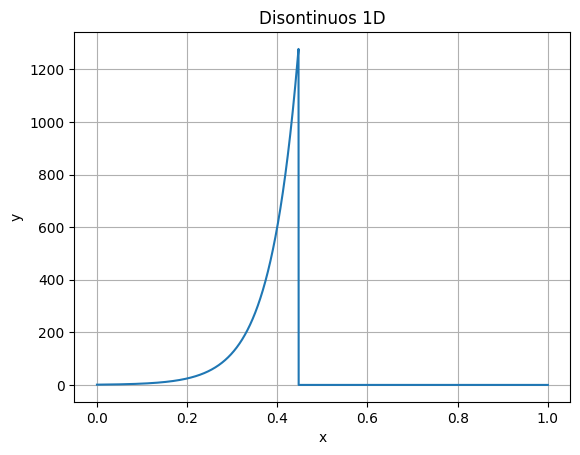

Training done! Time elapsed: 5.98 seconds
Test Loss: 42568.6718750000
79.84954
Iteration 8 is running!


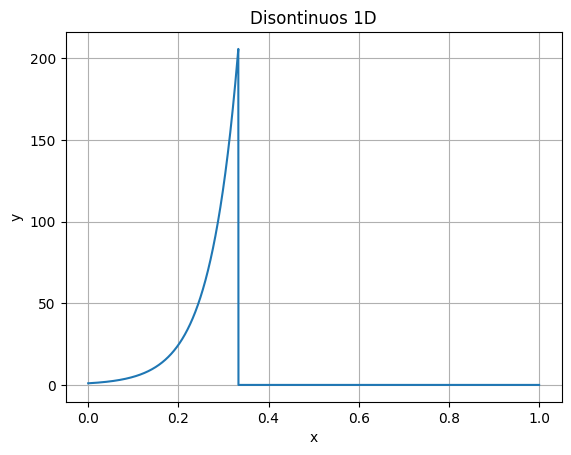

Training done! Time elapsed: 6.16 seconds
Test Loss: 1362.9451904297
12.810653
Iteration 9 is running!


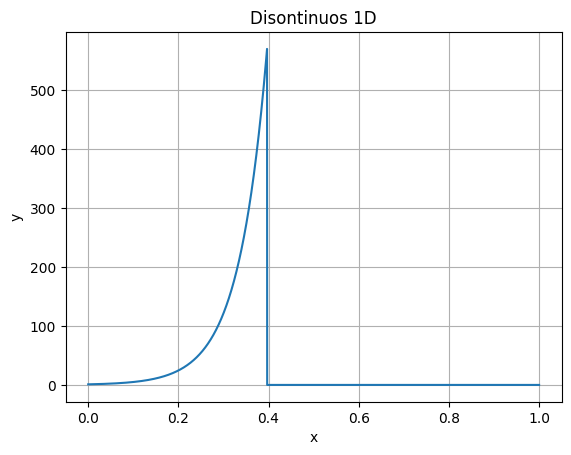

Training done! Time elapsed: 5.90 seconds
Test Loss: 8562.1582031250
35.612354
Iteration 10 is running!


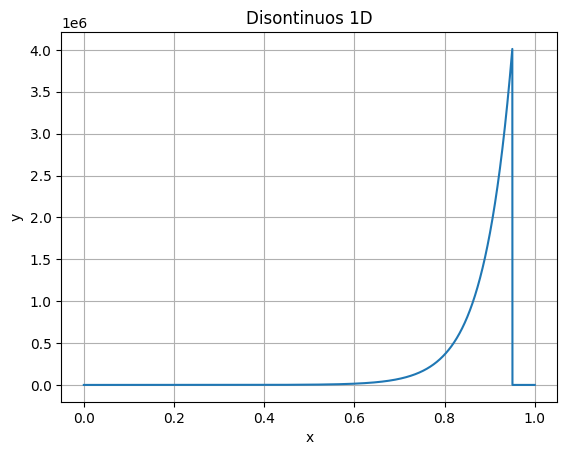

Training done! Time elapsed: 5.76 seconds
Test Loss: 625954717696.0000000000
250930.56


In [49]:
results6 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results6.append(test_disk_1d(i, 16))

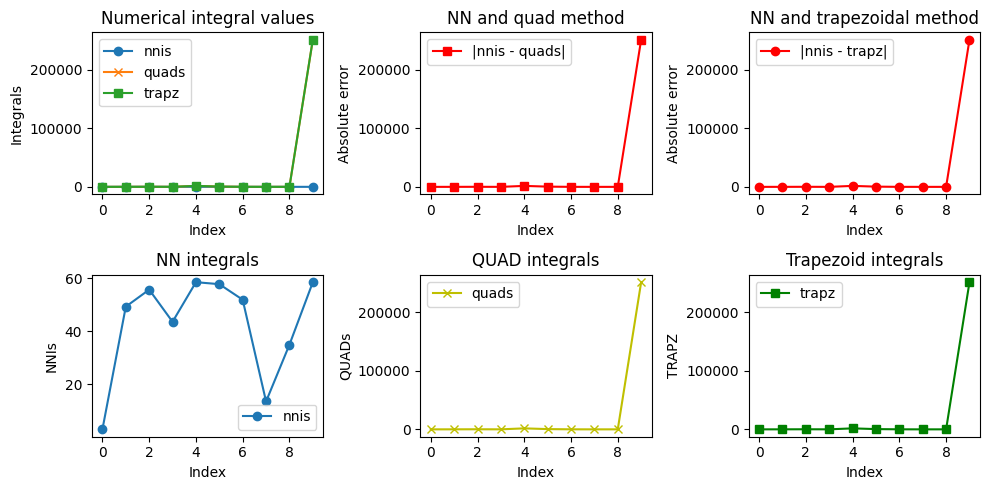

In [50]:
plot_test_results(results6)

# 2D Testing

## Hyperparams for 2D

In [28]:
input_size = 2
hidden_size = 100
learning_rate = 0.001
num_epochs = 5000

a = [0.0, 0.0]
b = [1.0, 1.0]

# Oscillatory 2D

In [40]:
def test_osc_2d(iteration_index: int, h: float, ej: float = 1):

    u = [random.uniform(0, 1) for _ in range(input_size)]
    cs = [random.uniform(0, 1) for _ in range(input_size)]
    fraction = h / (input_size ** ej * sum(cs))
    c = [fraction * value for value in cs]
    
    def osc_2d(X):
        sum_ = 0
        for i in range(input_size):
            sum_ += c[i] * X[:, i]

        return torch.cos(2 * math.pi * u[0] + sum_)
    
    def osc_2d_float(X):
        sum_ = 0
        for i in range(input_size):
            sum_ += c[i] * X[i]
        return math.cos(2 * math.pi * u[0] + sum_)
  
    X, y = generate_data(osc_2d, lower=a, upper=b, n_samples=120, n_dim=input_size)

    
    x1_coords = X[:, 0].numpy()
    x2_coords = X[:, 1].numpy()
    values = y.squeeze().numpy()
    
    plt.figure(figsize=(8, 6))
    plt.scatter(x1_coords, x2_coords, c=values, cmap='viridis', s=5)  # Use 'c' for color mapping
    plt.colorbar(label='f(x1, x2)')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.title('Oscillatory 2D')
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    nni = NeuralNumericalIntegration.integrate(model, a, b)
    result_quad = integrate_2d_nquad(osc_2d_float, lower=a, upper=b)
    result_trapz = integrate_2d_trapz(osc_2d, lower=a, upper=b)
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


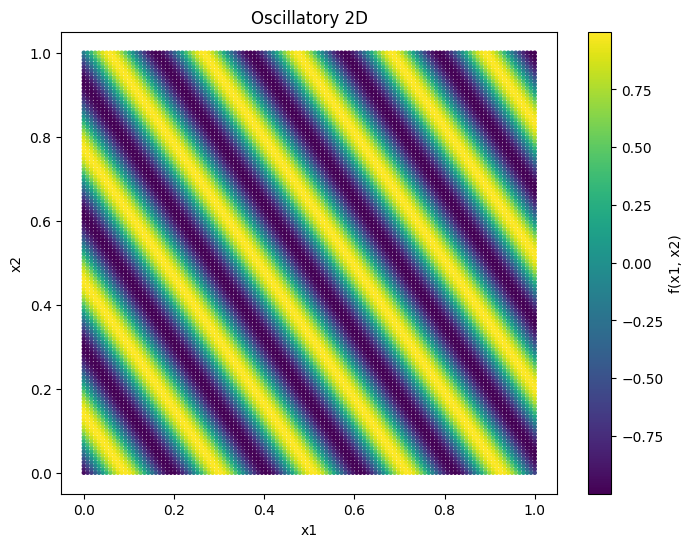

Training done! Time elapsed: 37.32 seconds
Test Loss: 0.4994843304
(0.014386151415556943, 0.0019535067070903358, 0.0019318992492953083)
Iteration 2 is running!


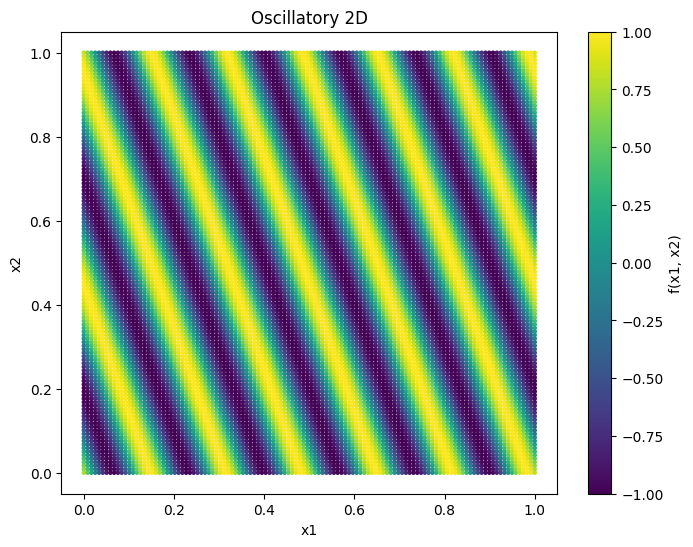

Training done! Time elapsed: 37.42 seconds
Test Loss: 0.5011409521
(-0.19923410855368956, 3.071871326932148e-05, 3.030912976846141e-05)
Iteration 3 is running!


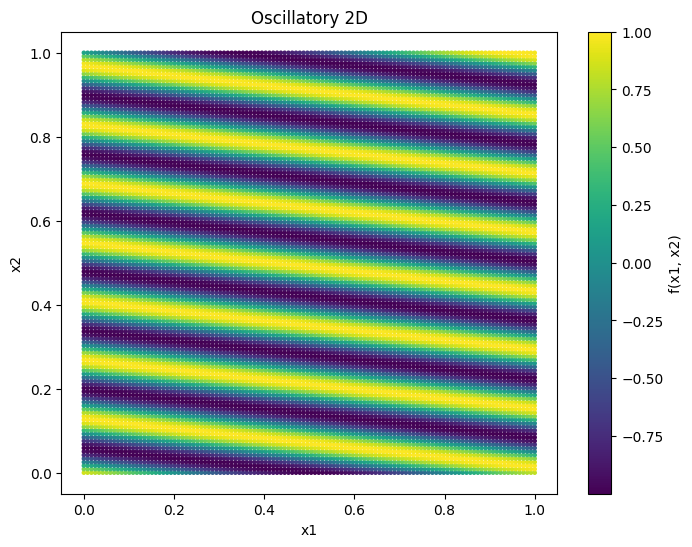

Training done! Time elapsed: 39.11 seconds
Test Loss: 0.5050582886
(-0.39782820502252547, -0.0037204501871678265, -0.003655739012139877)
Iteration 4 is running!


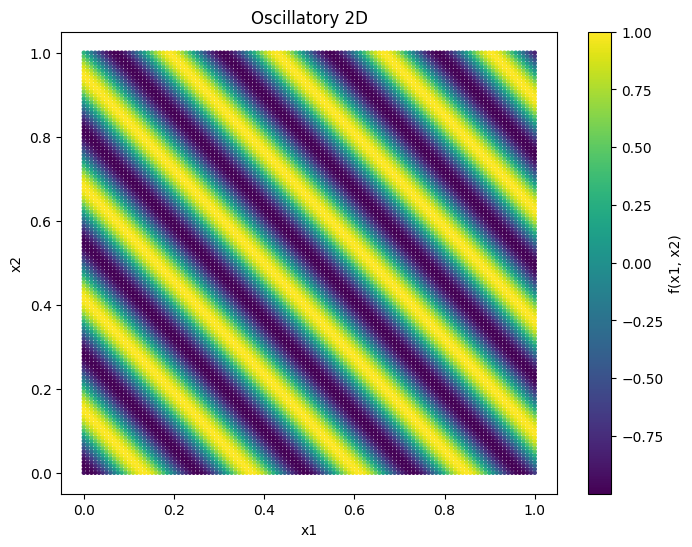

Training done! Time elapsed: 39.94 seconds
Test Loss: 0.5121948123
(0.03524224317755903, 0.0021793800548726167, 0.0021561852685536616)
Iteration 5 is running!


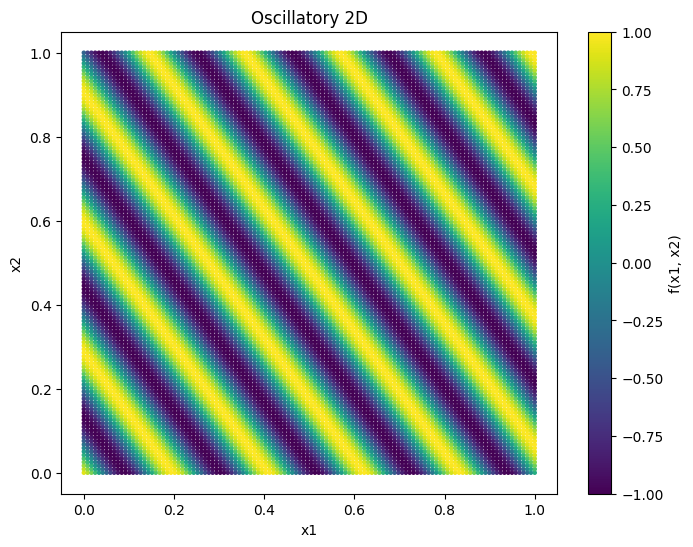

Training done! Time elapsed: 38.01 seconds
Test Loss: 0.5054396987
(-0.10855821979054464, -0.0033509004939443767, -0.0033141001724384315)
Iteration 6 is running!


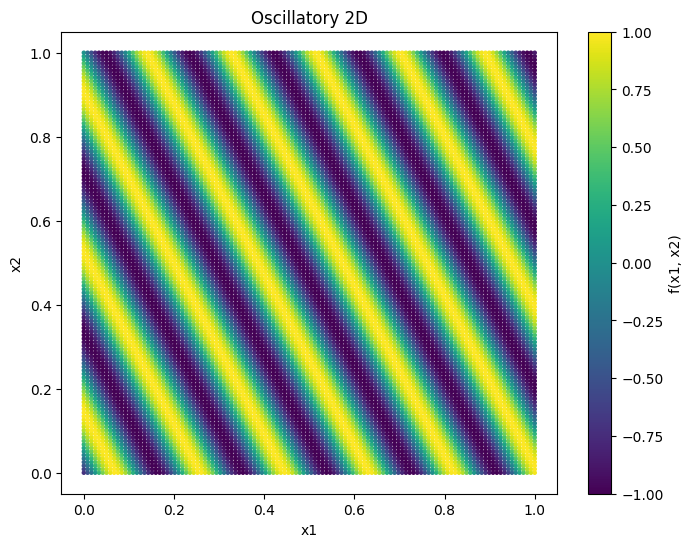

Training done! Time elapsed: 39.11 seconds
Test Loss: 0.4862914979
(0.0971511411204302, 0.004673032998017631, 0.004617612150453573)
Iteration 7 is running!


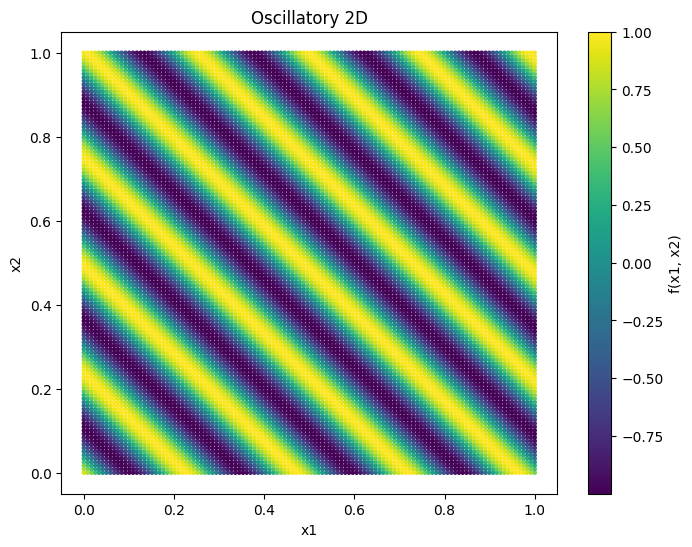

Training done! Time elapsed: 38.41 seconds
Test Loss: 0.5005695820
(-0.09502815242745494, -0.00043069811703774156, -0.00042612558132880374)
Iteration 8 is running!


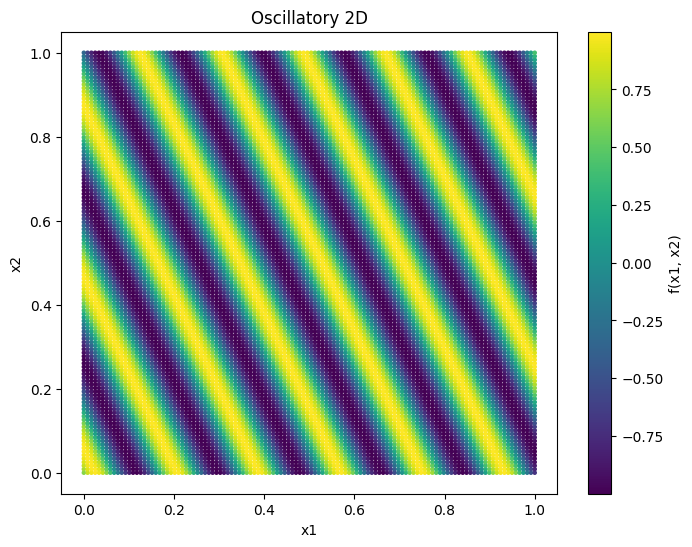

Training done! Time elapsed: 37.42 seconds
Test Loss: 0.5045108199
(-0.0023381712607131386, -0.003927041045350108, -0.003879099030609308)
Iteration 9 is running!


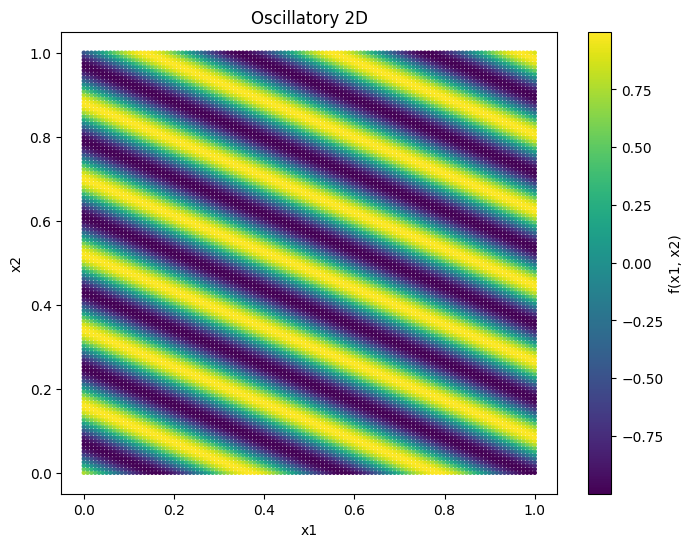

Training done! Time elapsed: 37.37 seconds
Test Loss: 0.4825254977
(-0.04293732217121973, -0.00593792848891498, -0.00586490760361861)
Iteration 10 is running!


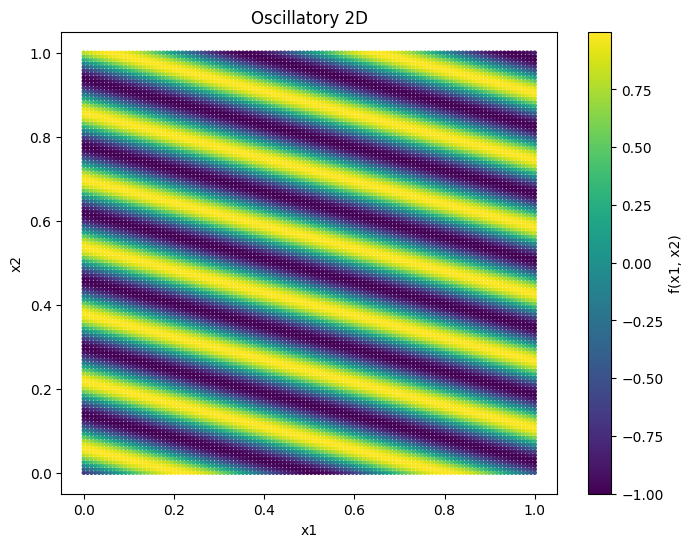

Training done! Time elapsed: 37.85 seconds
Test Loss: 0.5037605166
(0.12560628032219046, 0.004379458448458375, 0.004317494950109805)


In [41]:
results7 = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results7.append(test_osc_2d(i, h=100))
    print(results7[i])

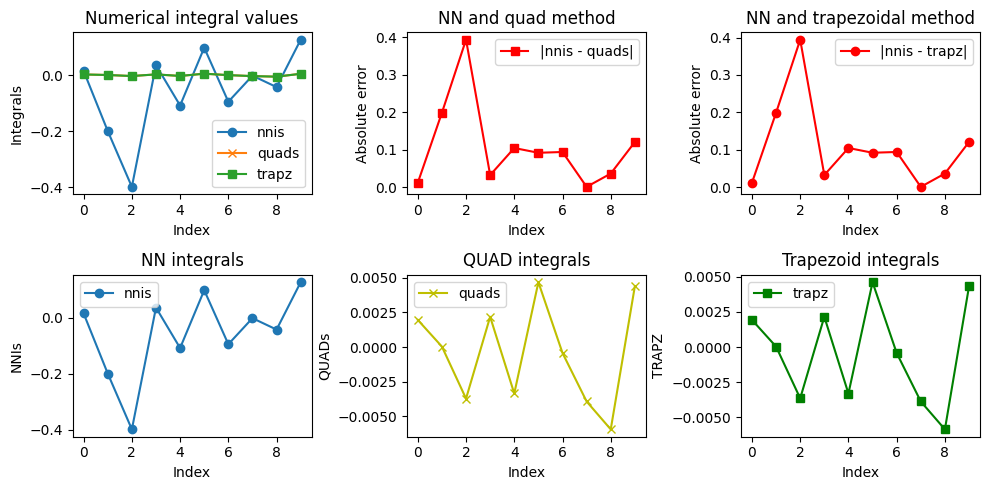

In [42]:
plot_test_results(results7)

# Product Peak 2D

In [54]:
def test_prod_peak_2d(iteration_index: int, h: float, ej: float = 1):
    dim = 2
    u = [random.uniform(0, 1) for _ in range(dim)]
    cs = [random.uniform(0, 1) for _ in range(dim)]
    fraction = h / (dim ** ej * sum(cs))
    c = [fraction * value for value in cs]
    
    def prod_peek_2d(X):
        prod_ = 1
        for i in range(2):
            prod_ *= (c[i] ** (-2) + (X[:, i] - u[i])**2) ** (-1)
        return prod_

    def prod_peek_2d_float(X):
        prod_ = 1
        for i in range(2):
            prod_ *= (c[i] ** (-2) + (X[i] - u[i])**2) ** (-1)
        return prod_
  
    X, y = generate_data(prod_peek_2d, params=[u, c], lower=[a, a], upper=[b, b], n_samples=120, n_dim=dim)

    
    x1_coords = X[:, 0].numpy()
    x2_coords = X[:, 1].numpy()
    values = y.squeeze().numpy()
    values_log = np.log(values + 0.000000001)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(x1_coords, x2_coords, c=values_log, cmap='viridis', s=5, vmin=np.min(values_log), vmax=np.max(values_log))  # Use 'c' for color mapping
    plt.colorbar(label='ln(f(x1, x2)+c)')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.title('Poduct Peak 2D')
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params_2d(model)
    nni = get_2D_NN_integral(a, b, a, b, bs1, we1, bs2, we2)
    result_quad = integrate_2d_nquad(prod_peek_2d_float, lower=[a, a], upper=[b, b])
    result_trapz = integrate_2d_trapz(prod_peek_2d, lower=[a, a], upper=[b, b])
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


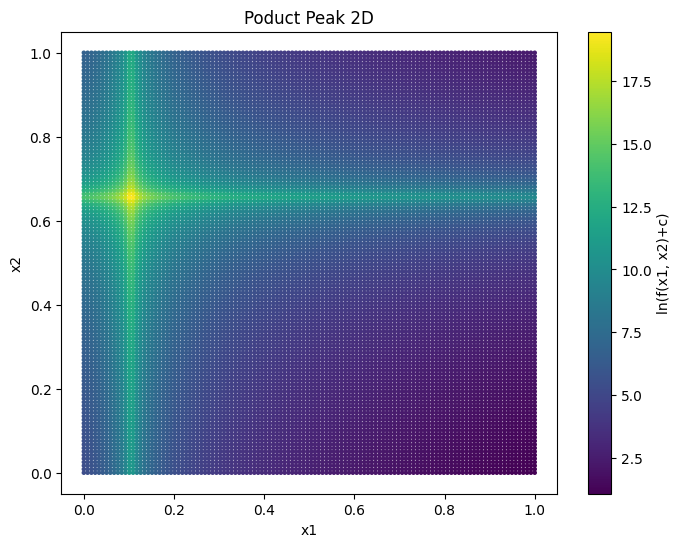

Training done! Time elapsed: 38.33 seconds
Test Loss: 10379716460544.0000000000
(535.244262422903, 208391.60642826057, 199879.0100072662)
Iteration 2 is running!


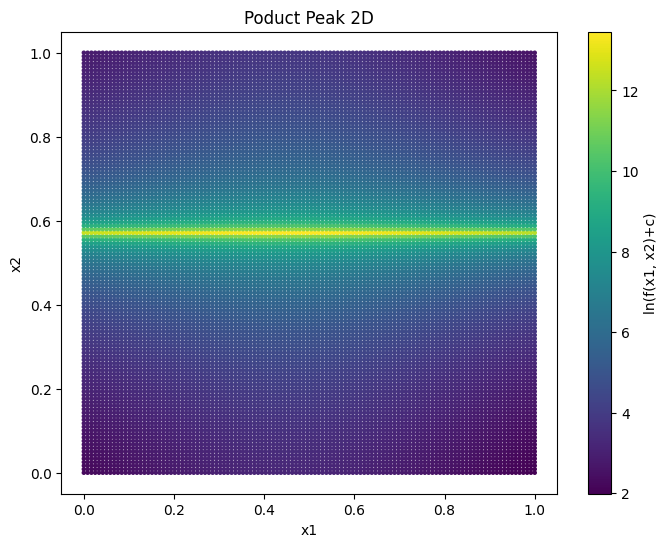

Training done! Time elapsed: 38.36 seconds
Test Loss: 1708439552.0000000000
(530.2881742977308, 5008.863723050134, 4063.8062537190476)


In [55]:
results8 = []
for i in range(2):
    print(f"Iteration {i+1} is running!")
    results8.append(test_prod_peak_2d(i, h=600))
    print(results8[i])

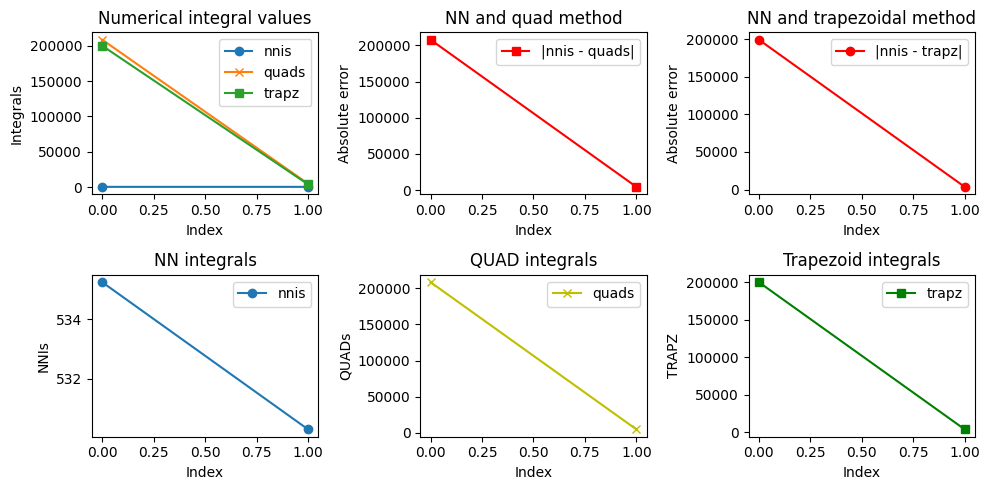

In [56]:
plot_test_results(results8)

# Corner Peak 2D

In [16]:
def test_osc_2d(iteration_index: int, h: float, ej: float = 1):
    dim = 2
    u = [random.uniform(0, 1) for _ in range(dim)]
    cs = [random.uniform(0, 1) for _ in range(dim)]
    fraction = h / (dim ** ej * sum(cs))
    c = [fraction * value for value in cs]
    
    def corn_peek_2d(X):
        sum_ = 0
        for i in range(2):
            sum_ += c[i] * X[:, i]
        return (1 + sum_) ** (-3)

    def corn_peek_2d_float(X):
        sum_ = 0
        for i in range(2):
            sum_ += c[i] * X[i]
        return (1 + sum_) ** (-3)
  
    X, y = generate_data(corn_peek_2d, params=[u, c], lower=[a, a], upper=[b, b], n_samples=120, n_dim=dim)

    
    x1_coords = X[:, 0].numpy()
    x2_coords = X[:, 1].numpy()
    values = y.squeeze().numpy()
    values_log = np.log(values + 0.000000001)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(x1_coords, x2_coords, c=values_log, cmap='viridis', s=5, vmin=np.min(values_log), vmax=np.max(values_log))  # Use 'c' for color mapping
    plt.colorbar(label='ln(f(x1, x2)+c)')
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.title('Corner Peak 2D')
    plt.show()
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    
    model = MLP(input_size, hidden_size)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_history = train_model(model, criterion, optimizer, x_train, y_train, num_epochs, verbose=False)
    
    test_loss = test_model(model, criterion, x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    bs1, we1, bs2, we2 = extract_model_params_2d(model)
    nni = get_2D_NN_integral(a, b, a, b, bs1, we1, bs2, we2)
    result_quad = integrate_2d_nquad(corn_peek_2d_float, lower=[a, a], upper=[b, b])
    result_trapz = integrate_2d_trapz(corn_peek_2d, lower=[a, a], upper=[b, b])
   
    return float(nni[0]), result_quad, result_trapz

Iteration 1 is running!


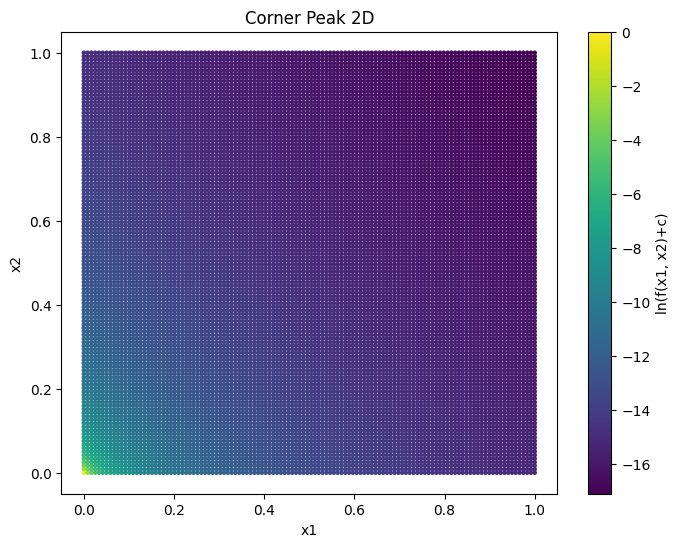

Training done! Time elapsed: 37.58 seconds
Test Loss: 0.0000002964
(9.778994968008548e-05, 2.2090731050972606e-05, 4.321442707942794e-05)
Iteration 2 is running!


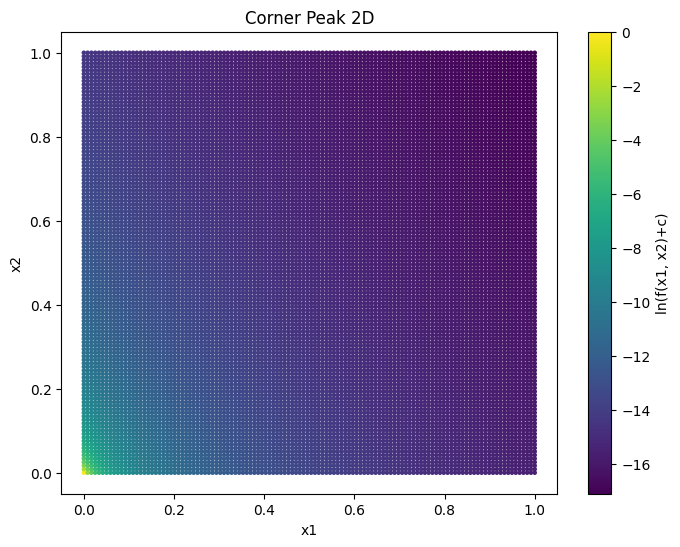

Training done! Time elapsed: 37.15 seconds
Test Loss: 0.0006932538
(3.38995413687454e-05, 2.2956943746734503e-05, 4.4552153697626034e-05)
Iteration 3 is running!


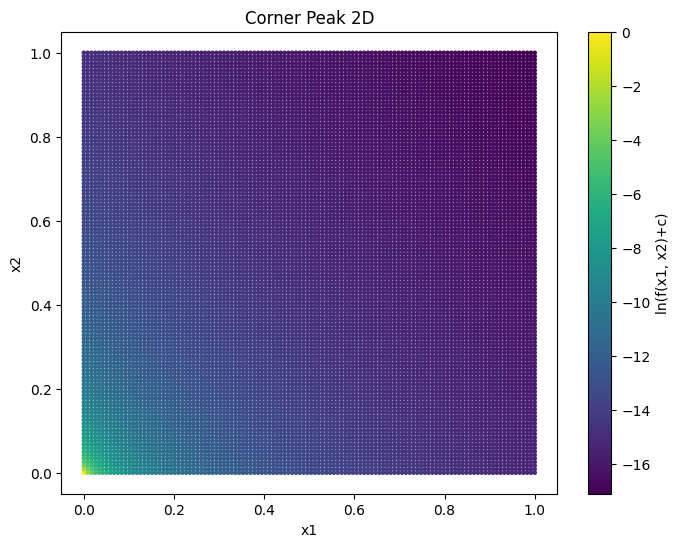

Training done! Time elapsed: 36.91 seconds
Test Loss: 0.0006934062
(3.303723474476494e-05, 2.2183465089111362e-05, 4.3356641221830675e-05)
Iteration 4 is running!


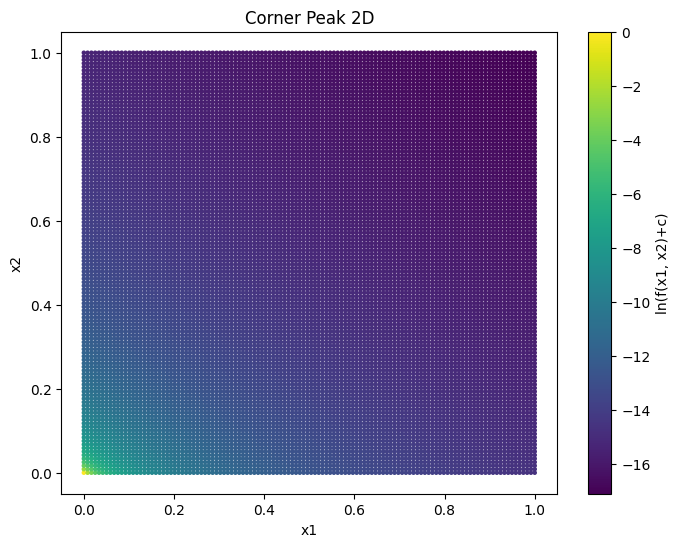

Training done! Time elapsed: 37.53 seconds
Test Loss: 0.0000001603
(0.00011300231367113167, 2.232577256208916e-05, 4.3575355071530956e-05)
Iteration 5 is running!


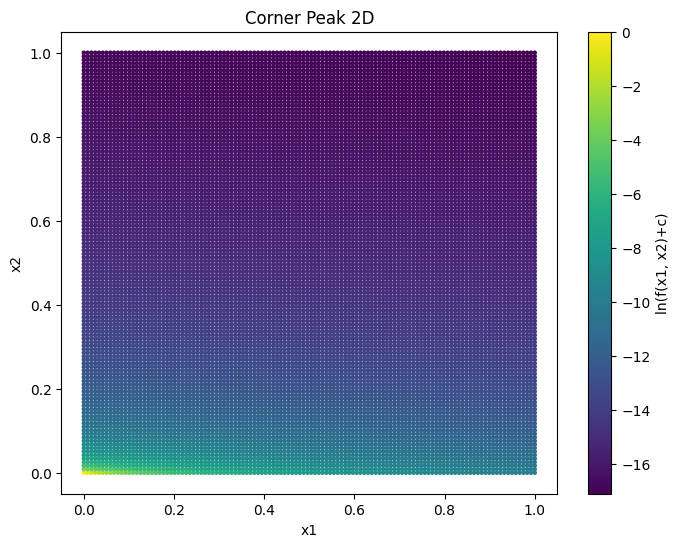

Training done! Time elapsed: 38.01 seconds
Test Loss: 0.0000008178
(0.00014380649716905225, 6.9216957903976e-05, 0.0001279781226658498)
Iteration 6 is running!


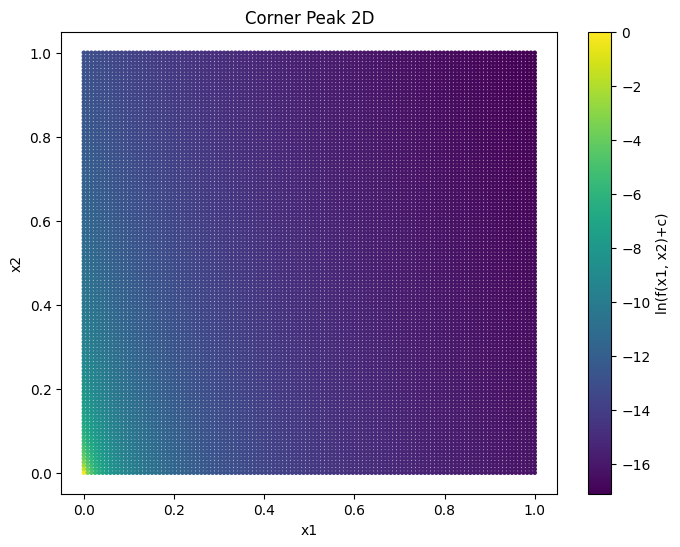

Training done! Time elapsed: 38.18 seconds
Test Loss: 0.0000006149
(0.00012182722599529683, 2.9489683519562234e-05, 5.518250460082088e-05)
Iteration 7 is running!


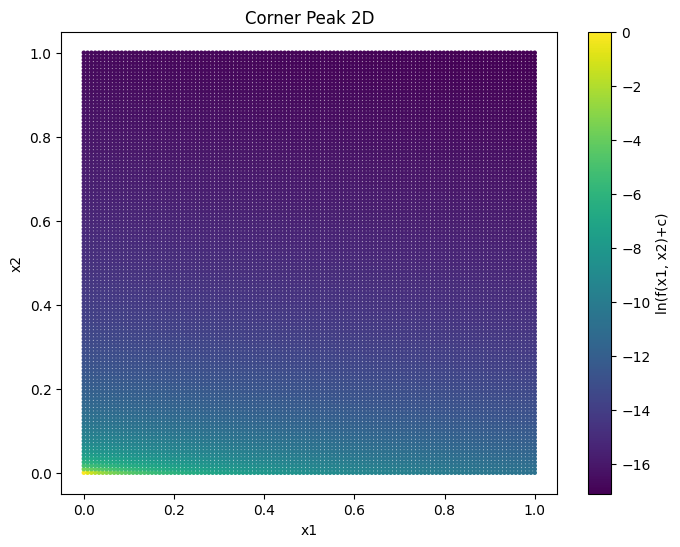

Training done! Time elapsed: 37.37 seconds
Test Loss: 0.0000013563
(0.00019092001403419462, 5.40172482547557e-05, 9.925097453155384e-05)
Iteration 8 is running!


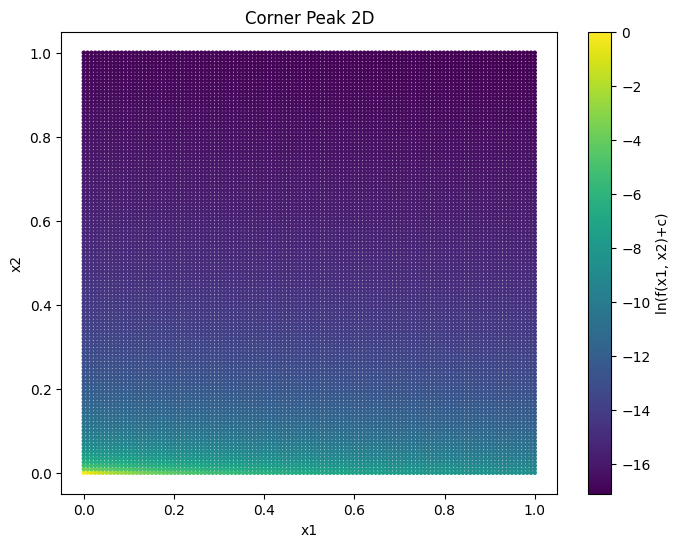

Training done! Time elapsed: 38.64 seconds
Test Loss: 0.0000113983
(0.00034409390127368433, 9.832069795400622e-05, 0.0001844546937948017)
Iteration 9 is running!


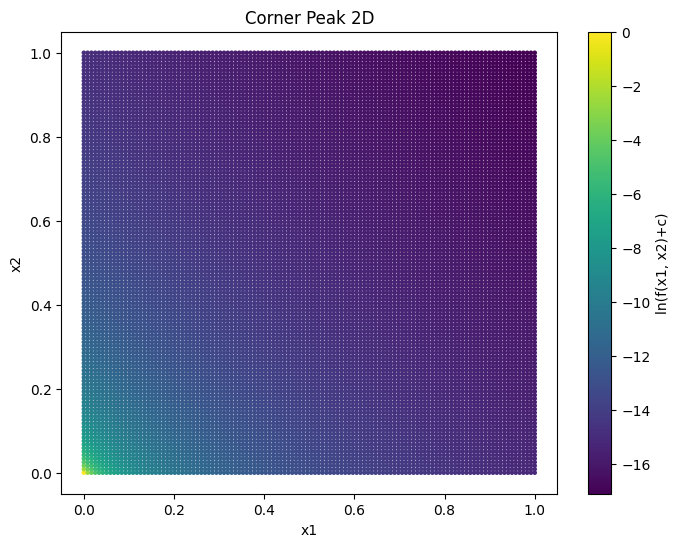

Training done! Time elapsed: 38.59 seconds
Test Loss: 0.0000004243
(0.00011356742836521327, 2.2050549213870868e-05, 4.3152882029964694e-05)
Iteration 10 is running!


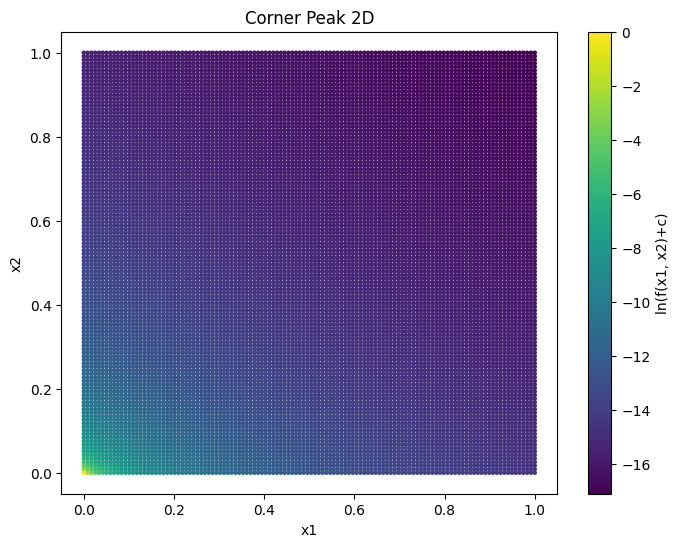

Training done! Time elapsed: 37.26 seconds
Test Loss: 0.0000001013
(8.975283065455752e-05, 2.2603375760331643e-05, 4.400363539489609e-05)


In [17]:
results = []
for i in range(10):
    print(f"Iteration {i+1} is running!")
    results.append(test_osc_2d(i, h=600))
    print(results[i])

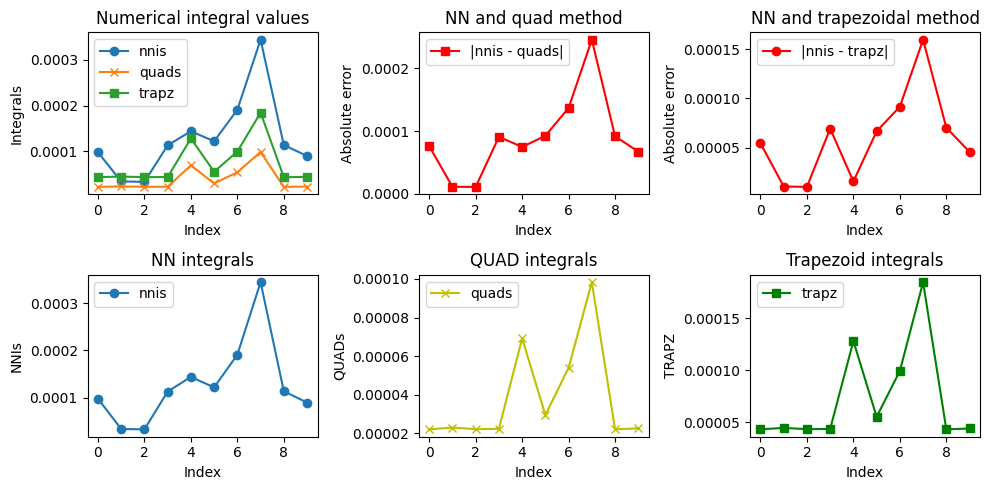

In [18]:
plot_test_results(results)